In [1]:
from IPython.display import display, Image, clear_output

# Comprehensive Lipidome Automation Workflow (CLAW)

Welcome to CLAW, a tool designed to facilitate and optimize the processing of lipidomic MRM data. This Jupyter notebook encapsulates a suite of tools that streamline the various stages of lipidomics data analysis.

Our toolset enables users to efficiently process MRM data files in the mzML format. Upload a file and CLAW will parse the data into a structured Pandas dataframe. This dataframe includes critical information like sample_ID, MRM transition, and signal intensity. Furthermore, our tool aligns each MRM transition with a default or custom lipid_database for accurate and swift annotation.

Moreover, CLAW is equipped with an OzESI option, a tool to elucidate the double bond location in lipid isomers. This feature allows users to input OzESI data and pinpoint the precise location of double bonds in isomeric lipids. Users have the flexibility to select which double bond locations they want to analyze. Following this, CLAW autonomously predicts potential m/z values and cross-references these predictions with sample data, ensuring a comprehensive and meticulous analysis.

With automation at its core, CLAW eliminates the need for manual data processing, significantly reducing time expenditure. It is a robust and invaluable tool for handling large volumes of lipid MRM data, accelerating scientific discovery in the field of lipidomics.

In [2]:
#Import all the necessary python libraries
import pymzml
import csv
import os
import pandas as pd
import numpy as np
import plotly.graph_objs as go
import json

#Import all the necessary CLAW libraries
# import create_directory
import CLAW_OzESI
from CLAW_OzESI import Parse

## Directory and File Management
For structured data management and efficient workflow, the system first ensures the presence of an output directory. If such a directory already exists you can skip this step.

In [3]:
# # Create the output directory. If it already exists you can skip this step.
# create_directory.create_project_folder()


The name of the project is defined next. This is important as the created directory will bear this name, allowing users to manage and identify their data with ease.

After the mzML files are uploaded to the designated mzML folder, the next block of code segregates these files based on their characteristics. More specifically, it filters the files and transfers them to respective folders named 'o3on' and 'o2only'.

In [4]:
# name_of_project = 'canola'
# #After you load mzml files to mzml folder. this will filter the files and move them to o3on and o2only folders
# create_directory.filter_o3mzml_files(name_of_project)

## Pre-Parsing Setup
The following block of code takes the preset variable values and uses them to parse the mzML files. The parsed data, including the sample ID, MRM transitions, and intensities, is stored in a pandas dataframe for easy manipulation and analysis.

The function CLAW.parsing_mzml_to_df takes several arguments. data_base_name_location is the location of the lipid database that contains information on lipid classes, fatty acid chains, and their corresponding MRM transitions. Project_Folder_data is the location of the mzML files for the samples to be analyzed. tolerance defines the acceptable range of deviation for the MRM transitions when matching them with the lipid database. The argument remove_std is a boolean that, when True, indicates to remove the MRM transitions that correspond to standards (internal or external) present in the samples.

The function outputs a pandas dataframe (df) where each row corresponds to an MRM transition detected in a sample, and columns include the sample ID, MRM transition, and intensity of the transition, among other values.

In [5]:

# Update the paths with your file locations:
data_base_name_location = "/scratch/negishi/iyer95/iyer95/CLAW_OzESI_Paper/CLAW/lipid_platform/lipid_database/Lipid_Database.xlsx"
Project_Folder_data = "/scratch/negishi/iyer95/iyer95/CLAW_OzESI_Paper/CLAW/lipid_platform/Projects/canola/mzml"
Project_results = "/scratch/negishi/iyer95/iyer95/CLAW_OzESI_Paper/CLAW/lipid_platform/Projects/canola/results"
file_name_to_save = "parsed_results"
tolerance = 0.3

# Create an instance of the Parse class with these paths and parameters.
parser = Parse(
    data_base_name_location=data_base_name_location,
    Project_Folder_data=Project_Folder_data,
    Project_results=Project_results,
    file_name_to_save=file_name_to_save,
    tolerance=tolerance,
    remove_std=True,
    save_data=False,          # Change to True if you want to save the parsed CSV
    batch_processing=True,    # True for processing a folder of mzML files
    plot_chromatogram=True    # Set to False if you do not need chromatogram plotting
)

# Instead of calling the three functions separately, call mrm_run_all:
df_MRM, df_OzESI, df_OzESI_matched = parser.mrm_run_all(deuterated=False)

# Now, df_MRM, df_OzESI, and df_OzESI_matched hold your parsed and matched data.

/scratch/negishi/iyer95/iyer95/CLAW_OzESI_Paper/OzESI_MUFA_paper/lipid_platform/CLAW_OzESI.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lipid_MRM_data['Parent_Ion'] = np.round(lipid_MRM_data['Parent_Ion'], 1)
/scratch/negishi/iyer95/iyer95/CLAW_OzESI_Paper/OzESI_MUFA_paper/lipid_platform/CLAW_OzESI.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lipid_MRM_data['Product_Ion'] = np.round(lipid_MRM_data['Product_Ion'], 1)
/scratch/negishi/iyer95/iyer95/CLAW_OzESI_Paper/OzESI_MUFA_paper/lipid_pla

Finished parsing mzML file: /scratch/negishi/iyer95/iyer95/CLAW_OzESI_Paper/CLAW/lipid_platform/Projects/canola/mzml/CrudeCanola_O3on_150gN3_02082023.mzML

Finished parsing mzML file: /scratch/negishi/iyer95/iyer95/CLAW_OzESI_Paper/CLAW/lipid_platform/Projects/canola/mzml/DegummedCanola_O3on_150gN3_02082023.mzML

Finished parsing mzML file: /scratch/negishi/iyer95/iyer95/CLAW_OzESI_Paper/CLAW/lipid_platform/Projects/canola/mzml/RBDCanola_O3on_150gN3_02082023.mzML

Finished parsing all mzML files



/scratch/negishi/iyer95/iyer95/CLAW_OzESI_Paper/OzESI_MUFA_paper/lipid_platform/CLAW_OzESI.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lipid_MRM_data['Parent_Ion'] = np.round(lipid_MRM_data['Parent_Ion'], 1)
/scratch/negishi/iyer95/iyer95/CLAW_OzESI_Paper/OzESI_MUFA_paper/lipid_platform/CLAW_OzESI.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lipid_MRM_data['Product_Ion'] = np.round(lipid_MRM_data['Product_Ion'], 1)
/scratch/negishi/iyer95/iyer95/CLAW_OzESI_Paper/OzESI_MUFA_paper/lipid_pla

Define the master dataframes where the data will be stored during the parsing step.

## CLAW.full_parse()
In this code, the `CLAW.full_parse()` function is used to analyze the MRM data. It takes several parameters like the location of the lipid database, paths to the data and results folders, the name of the result files, and the tolerance for MRM transitions matching. The function returns two dataframes: `df_matched` that contains information about each detected lipid species and their corresponding MRM transitions, and `OzESI_time_df` which captures data related to OzESI-MS scans, including potential double bond locations of lipids. If `remove_std` is `True`, it removes MRM transitions related to standards from the dataframe, and if `save_data` is `True`, the dataframe is saved as a .csv file in the specified results folder.

In [6]:
df_MRM.head(None)

,Class,Intensity,Lipid,Parent_Ion,Product_Ion,Sample_ID,Transition
0,NaN,5.451378e+05,NaN,760.6,571.596,CrudeCanola_O3on_150gN3_02082023,760.6 -> 571.596
1,NaN,6.208219e+05,NaN,762.6,573.596,CrudeCanola_O3on_150gN3_02082023,762.6 -> 573.596
2,NaN,9.441859e+05,NaN,764.6,575.596,CrudeCanola_O3on_150gN3_02082023,764.6 -> 575.596
3,NaN,1.137434e+06,NaN,766.7,577.596,CrudeCanola_O3on_150gN3_02082023,766.7 -> 577.596
4,NaN,5.900676e+05,NaN,782.6,593.596,CrudeCanola_O3on_150gN3_02082023,782.6 -> 593.596
...,...,...,...,...,...,...,...
100,TAG,4.897507e+05,[TG(54:6)]_FA18:1,896.8,597.596,RBDCanola_O3on_150gN3_02082023,896.8 -> 597.596
101,TAG,1.179904e+06,[TG(54:5)]_FA18:1,898.8,599.596,RBDCanola_O3on_150gN3_02082023,898.8 -> 599.596
102,TAG,1.654774e+06,"[TG(55:11),TG(54:4)]_FA18:1",900.8,601.596,RBDCanola_O3on_150gN3_02082023,900.8 -> 601.596
103,TAG,5.234119e+06,"[TG(55:10),TG(54:3)]_FA18:1",902.8,603.596,RBDCanola_O3on_150gN3_02082023,902.8 -> 603.596


The `read_mrm_list()` function is first invoked to read the MRM database from the specified file location and return it as a pandas DataFrame `mrm_database`. Subsequently, the `match_lipids_parser()` function is called to match the detected lipids from the `OzESI_time_df` DataFrame, obtained from the OzESI-MS scans, with the known lipids in the `mrm_database` based on the MRM transitions within the specified `tolerance`. The result is saved in the `df_oz_matched` DataFrame, which now contains matched lipid species from the OzESI-MS data.

### Confirm OzESI df before parsing data

In [7]:
df_OzESI

,Lipid,Parent_Ion,Product_Ion,Retention_Time,OzESI_Intensity,Sample_ID,Transition
0,NaN,760.6,571.596,0.015933,190.400009,CrudeCanola_O3on_150gN3_02082023,760.6 -> 571.596
1,NaN,760.6,571.596,0.032233,147.420013,CrudeCanola_O3on_150gN3_02082023,760.6 -> 571.596
2,NaN,760.6,571.596,0.048550,153.620010,CrudeCanola_O3on_150gN3_02082023,760.6 -> 571.596
3,NaN,760.6,571.596,0.064850,200.080017,CrudeCanola_O3on_150gN3_02082023,760.6 -> 571.596
4,NaN,760.6,571.596,0.081167,206.900009,CrudeCanola_O3on_150gN3_02082023,760.6 -> 571.596
...,...,...,...,...,...,...,...
225352,NaN,904.8,605.596,34.931700,148.500015,RBDCanola_O3on_150gN3_02082023,904.8 -> 605.596
225353,NaN,904.8,605.596,34.948000,131.800003,RBDCanola_O3on_150gN3_02082023,904.8 -> 605.596
225354,NaN,904.8,605.596,34.964317,151.960007,RBDCanola_O3on_150gN3_02082023,904.8 -> 605.596
225355,NaN,904.8,605.596,34.980617,137.700012,RBDCanola_O3on_150gN3_02082023,904.8 -> 605.596


In [8]:
df_OzESI_matched

,Class,Lipid,OzESI_Intensity,Parent_Ion,Product_Ion,Retention_Time,Sample_ID,Transition
0,NaN,NaN,190.400009,760.6,571.596,0.015933,CrudeCanola_O3on_150gN3_02082023,760.6 -> 571.596
1,NaN,NaN,147.420013,760.6,571.596,0.032233,CrudeCanola_O3on_150gN3_02082023,760.6 -> 571.596
2,NaN,NaN,153.620010,760.6,571.596,0.048550,CrudeCanola_O3on_150gN3_02082023,760.6 -> 571.596
3,NaN,NaN,200.080017,760.6,571.596,0.064850,CrudeCanola_O3on_150gN3_02082023,760.6 -> 571.596
4,NaN,NaN,206.900009,760.6,571.596,0.081167,CrudeCanola_O3on_150gN3_02082023,760.6 -> 571.596
...,...,...,...,...,...,...,...,...
225352,TAG,"[TG(55:9),TG(54:2)]_FA18:1",148.500015,904.8,605.596,34.931700,RBDCanola_O3on_150gN3_02082023,904.8 -> 605.596
225353,TAG,"[TG(55:9),TG(54:2)]_FA18:1",131.800003,904.8,605.596,34.948000,RBDCanola_O3on_150gN3_02082023,904.8 -> 605.596
225354,TAG,"[TG(55:9),TG(54:2)]_FA18:1",151.960007,904.8,605.596,34.964317,RBDCanola_O3on_150gN3_02082023,904.8 -> 605.596
225355,TAG,"[TG(55:9),TG(54:2)]_FA18:1",137.700012,904.8,605.596,34.980617,RBDCanola_O3on_150gN3_02082023,904.8 -> 605.596


# Peak Area

# plot parent ions

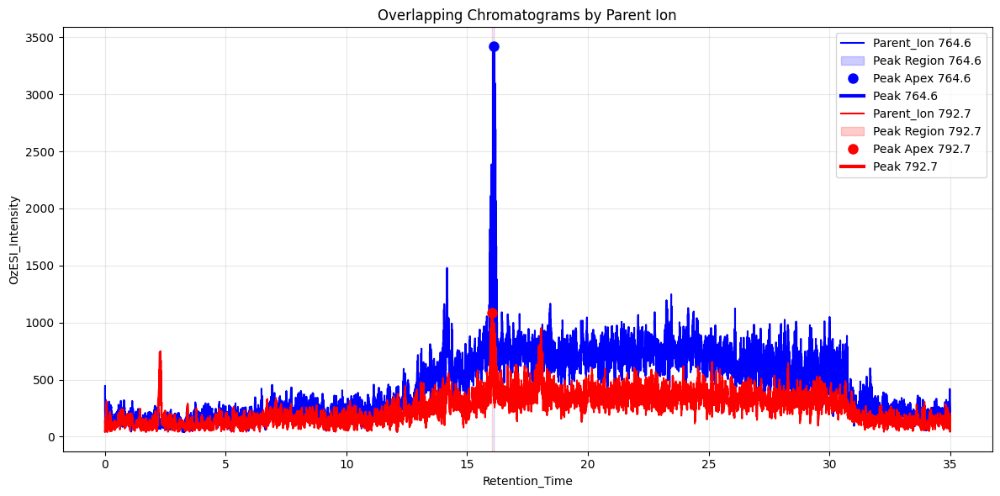

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.signal import find_peaks, peak_widths

def plot_overlapping_chromatograms(df, parent_ions, 
                                 intensity_column='OzESI_Intensity', 
                                 retention_column='Retention_Time', 
                                 colors=None,
                                 **peak_kwargs):
    """
    Plots overlapping chromatograms for multiple Parent_Ion values with peaks highlighted.
    
    Parameters:
        df (pd.DataFrame): DataFrame containing the chromatogram data
        parent_ions (list): List of Parent_Ion values to plot
        intensity_column (str): Column name for the intensity values
        retention_column (str): Column name for the retention time values
        colors (list): Optional list of colors for each Parent_Ion
        **peak_kwargs: Additional keyword arguments for peak finding
    """
    plt.figure(figsize=(12, 6))
    
    if colors is None:
        colors = ['blue', 'red']  # default colors
    
    for parent_ion, color in zip(parent_ions, colors):
        # Filter the DataFrame for the specified Parent_Ion
        ion_df = df[df['Parent_Ion'] == parent_ion].copy()
        if ion_df.empty:
            print(f"No data found for Parent_Ion: {parent_ion}")
            continue

        # Sort by retention time
        ion_df.sort_values(by=retention_column, inplace=True)
        retention_times = ion_df[retention_column].values
        intensities = ion_df[intensity_column].values

        # Plot the chromatogram
        plt.plot(retention_times, intensities, 
                label=f'Parent_Ion {parent_ion}', 
                color=color, 
                linewidth=1.5)
        
        # Detect peaks
        peaks, properties = find_peaks(intensities, **peak_kwargs)
        if len(peaks) == 0:
            print(f"No peaks detected for Parent_Ion {parent_ion}")
            continue

        # Find highest peak
        highest_peak_index = peaks[np.argmax(intensities[peaks])]
        
        # Calculate peak widths
        widths_results = peak_widths(intensities, [highest_peak_index], rel_height=0.3)
        left_ip = widths_results[2][0]
        right_ip = widths_results[3][0]
        
        # Convert to retention times
        left_rt = np.interp(left_ip, np.arange(len(retention_times)), retention_times)
        right_rt = np.interp(right_ip, np.arange(len(retention_times)), retention_times)
        
        # Highlight peak region
        plt.axvspan(left_rt, right_rt, 
                   color=color, 
                   alpha=0.2, 
                   label=f'Peak Region {parent_ion}')
        
        # Mark peak apex
        apex_rt = retention_times[highest_peak_index]
        apex_intensity = intensities[highest_peak_index]
        plt.plot(apex_rt, apex_intensity, 
                'o', 
                color=color, 
                markersize=8, 
                label=f'Peak Apex {parent_ion}')
        
        # Highlight peak area
        peak_mask = (retention_times >= left_rt) & (retention_times <= right_rt)
        if np.any(peak_mask):
            plt.plot(retention_times[peak_mask], intensities[peak_mask],
                    color=color, 
                    linewidth=3, 
                    label=f'Peak {parent_ion}')

    plt.xlabel(retention_column)
    plt.ylabel(intensity_column)
    plt.title('Overlapping Chromatograms by Parent Ion')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Example usage:
parent_ions = [764.6, 792.7]
colors = ['blue', 'red']
plot_overlapping_chromatograms(df_OzESI_matched, 
                             parent_ions=parent_ions, 
                             colors=colors,
                             height=100)

# gpt again try

# update code with RT windows

In [10]:
import pandas as pd
import numpy as np
from scipy.signal import find_peaks, peak_widths

# Make a deep copy and sort by retention time.
df_OzESI_matched_sorted = df_OzESI_matched.copy(deep=True)
df_OzESI_matched_sorted = df_OzESI_matched_sorted.sort_values('Retention_Time').reset_index(drop=True)

def process_peaks_for_group(group, rel_height=0.95, **find_peaks_kwargs):
    """
    For one group (i.e. one Parent_Ion within one Sample_ID), detect peaks and compute:
      - peak_area: the area under the peak (integrated using np.trapz)
      - peak_start: the interpolated retention time at the left boundary of the peak
      - peak_stop:  the interpolated retention time at the right boundary of the peak
      - peak_middle: the interpolated retention time at the peak apex

    Additionally, we constrain the left and right boundaries to be no more than 0.6
    away from the peak center.
    """
    # Sort the data by retention time
    group = group.sort_values('Retention_Time').copy()
    
    # Get the retention time and intensity arrays
    rt = group['Retention_Time'].values
    intensity = group['OzESI_Intensity'].values
    
    # Detect peaks in the intensity data
    peaks, properties = find_peaks(intensity, **find_peaks_kwargs)
    
    # Calculate the peak widths at the given relative height (default is 95% of the peak height)
    widths, width_heights, left_ips, right_ips = peak_widths(intensity, peaks, rel_height=rel_height)
    
    # Create new columns (initialize to NaN)
    group['peak_area'] = np.nan
    group['peak_start'] = np.nan
    group['peak_stop'] = np.nan
    group['peak_middle'] = np.nan

    # Process each detected peak
    for i, peak_idx in enumerate(peaks):
        # Use interpolation to convert fractional indices into retention times.
        left_rt = np.interp(left_ips[i], np.arange(len(rt)), rt)
        right_rt = np.interp(right_ips[i], np.arange(len(rt)), rt)
        peak_rt = np.interp(peak_idx, np.arange(len(rt)), rt)
        
        # --- Constrain boundaries to be at most 0.6 away from the peak middle ---
        if (peak_rt - left_rt) > 0.6:
            left_rt = peak_rt - 0.6
        if (right_rt - peak_rt) > 0.6:
            right_rt = peak_rt + 0.6

        # Determine indices corresponding to the (possibly adjusted) boundaries.
        # We use np.searchsorted because rt is sorted.
        left_index = np.searchsorted(rt, left_rt, side='left')
        right_index = np.searchsorted(rt, right_rt, side='right') - 1
        left_index = max(left_index, 0)
        right_index = min(right_index, len(rt) - 1)
        
        # Integration: use the retention times and intensity values from these indices.
        rt_segment = rt[left_index:right_index+1]
        intensity_segment = intensity[left_index:right_index+1]
        area = np.trapz(intensity_segment, rt_segment)
        
        # For all rows in this group that fall between the left and right boundaries,
        # assign the computed peak information.
        mask = (group['Retention_Time'] >= left_rt) & (group['Retention_Time'] <= right_rt)
        group.loc[mask, 'peak_area'] = area
        group.loc[mask, 'peak_start'] = left_rt
        group.loc[mask, 'peak_stop'] = right_rt
        group.loc[mask, 'peak_middle'] = peak_rt

    return group

def process_all_peaks(df, rel_height=0.95, **find_peaks_kwargs):
    """
    Processes the entire DataFrame by grouping on both Parent_Ion and Sample_ID,
    so that each chromatogram (from each sample) is processed separately.
    """
    return df.groupby(['Parent_Ion', 'Sample_ID'], group_keys=False).apply(
        process_peaks_for_group, rel_height=rel_height, **find_peaks_kwargs
    )

# --- Example usage ---
# Ensure that df_OzESI_matched_sorted is your DataFrame that has the columns:
# 'Parent_Ion', 'OzESI_Intensity', 'Retention_Time', and 'Sample_ID'
#
# Optionally, adjust the peak detection parameters.
# For example:
# processed_df = process_all_peaks(df_OzESI_matched_sorted, rel_height=0.5, prominence=1000)
#
# Or run with default settings:
processed_df = process_all_peaks(df_OzESI_matched_sorted)

# Now the DataFrame processed_df includes new columns:
# 'peak_area', 'peak_start', 'peak_stop', and 'peak_middle'
print(processed_df.head())


    Class Lipid  OzESI_Intensity  Parent_Ion  Product_Ion  Retention_Time  \
103   NaN   NaN       190.400009       760.6      571.596        0.015933   
208   NaN   NaN       147.420013       760.6      571.596        0.032233   
314   NaN   NaN       153.620010       760.6      571.596        0.048550   
417   NaN   NaN       200.080017       760.6      571.596        0.064850   
522   NaN   NaN       206.900009       760.6      571.596        0.081167   

                            Sample_ID        Transition  peak_area  \
103  CrudeCanola_O3on_150gN3_02082023  760.6 -> 571.596        NaN   
208  CrudeCanola_O3on_150gN3_02082023  760.6 -> 571.596        NaN   
314  CrudeCanola_O3on_150gN3_02082023  760.6 -> 571.596   9.502543   
417  CrudeCanola_O3on_150gN3_02082023  760.6 -> 571.596   9.502543   
522  CrudeCanola_O3on_150gN3_02082023  760.6 -> 571.596   9.502543   

     peak_start  peak_stop  peak_middle  
103         NaN        NaN          NaN  
208         NaN        NaN      

/tmp/ipykernel_1177436/2591646965.py:79: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby(['Parent_Ion', 'Sample_ID'], group_keys=False).apply(


In [11]:
# sort by highest peak_area
processed_df.sort_values(by='peak_area', ascending=False, inplace=True)
# # sort by Retention_Time
processed_df.sort_values(by='Retention_Time', inplace=True)
# sort by peak area and then by Retention_Time
# processed_df.sort_values(by=['peak_area', 'Retention_Time'], ascending=[False, True], inplace=True)
processed_df

,Class,Lipid,OzESI_Intensity,Parent_Ion,Product_Ion,Retention_Time,Sample_ID,Transition,peak_area,peak_start,peak_stop,peak_middle
1,TAG,"[TG(55:9),TG(54:2)]_FA18:1",58.840004,904.8,605.596,0.000117,CrudeCanola_O3on_150gN3_02082023,904.8 -> 605.596,NaN,NaN,NaN,NaN
0,TAG,"[TG(55:9),TG(54:2)]_FA18:1",91.240005,904.8,605.596,0.000117,RBDCanola_O3on_150gN3_02082023,904.8 -> 605.596,NaN,NaN,NaN,NaN
2,TAG,"[TG(55:9),TG(54:2)]_FA18:1",236.380020,904.8,605.596,0.000117,DegummedCanola_O3on_150gN3_02082023,904.8 -> 605.596,NaN,NaN,NaN,NaN
3,TAG,"[TG(55:10),TG(54:3)]_FA18:1",42.540005,902.8,603.596,0.000583,CrudeCanola_O3on_150gN3_02082023,902.8 -> 603.596,NaN,NaN,NaN,NaN
5,TAG,"[TG(55:10),TG(54:3)]_FA18:1",117.000008,902.8,603.596,0.000583,RBDCanola_O3on_150gN3_02082023,902.8 -> 603.596,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
225352,TAG,"[TG(53:10),TG(52:3)]_FA18:1",113.300011,874.8,575.596,35.000217,RBDCanola_O3on_150gN3_02082023,874.8 -> 575.596,NaN,NaN,NaN,NaN
225353,TAG,"[TG(53:10),TG(52:3)]_FA18:1",213.540009,874.8,575.596,35.000233,DegummedCanola_O3on_150gN3_02082023,874.8 -> 575.596,NaN,NaN,NaN,NaN
225355,TAG,[TG(52:4)]_FA18:1,152.140015,872.8,573.596,35.000683,CrudeCanola_O3on_150gN3_02082023,872.8 -> 573.596,NaN,NaN,NaN,NaN
225354,TAG,[TG(52:4)]_FA18:1,65.220001,872.8,573.596,35.000683,RBDCanola_O3on_150gN3_02082023,872.8 -> 573.596,NaN,NaN,NaN,NaN


# plot peaks chatgpt newest

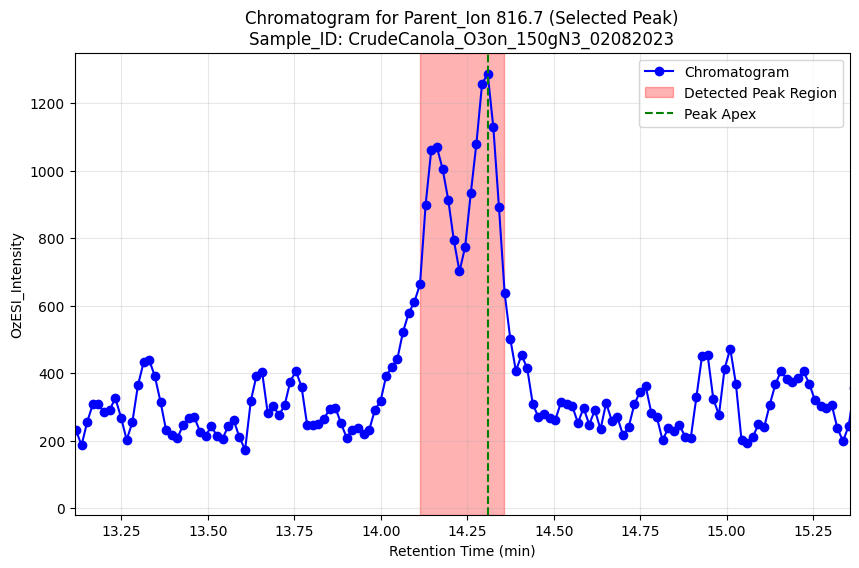


Peak Details for Sample: CrudeCanola_O3on_150gN3_02082023
Start Time: 14.11 min
Apex Time: 14.31 min
End Time: 14.36 min
Peak Width: 0.24 min
Peak Area: 232.91


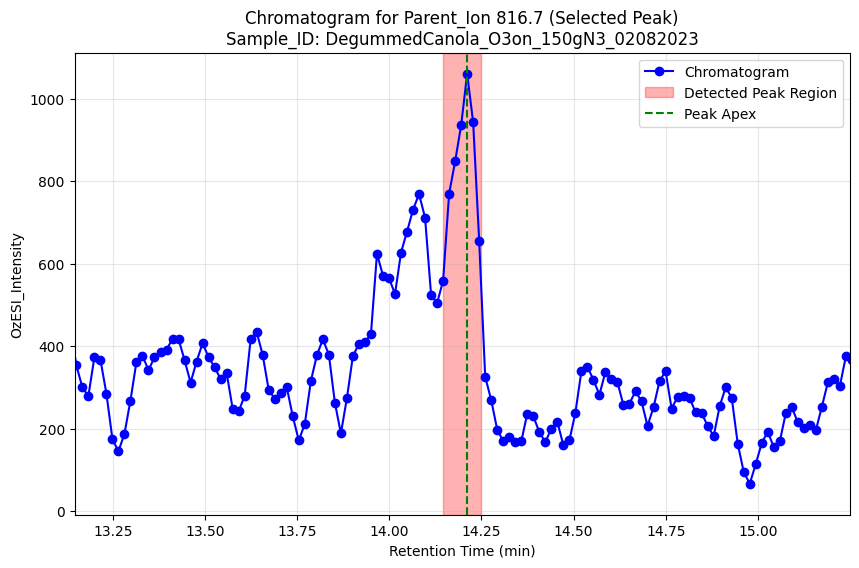


Peak Details for Sample: DegummedCanola_O3on_150gN3_02082023
Start Time: 14.15 min
Apex Time: 14.21 min
End Time: 14.25 min
Peak Width: 0.10 min
Peak Area: 86.78


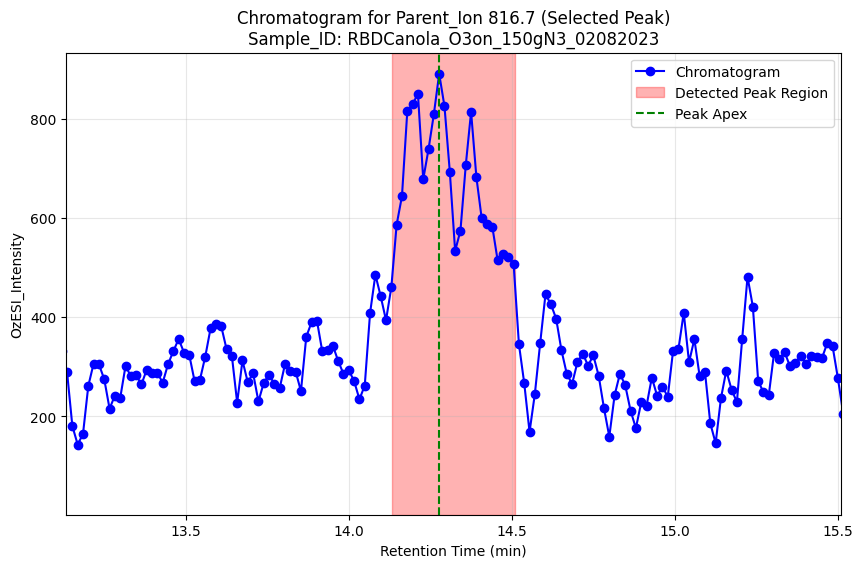


Peak Details for Sample: RBDCanola_O3on_150gN3_02082023
Start Time: 14.13 min
Apex Time: 14.28 min
End Time: 14.51 min
Peak Width: 0.38 min
Peak Area: 253.87


In [12]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.signal import find_peaks, peak_widths
from scipy.interpolate import interp1d

# Define the target Parent_Ion and the list of sample IDs
target_parent_ion = 816.7
sample_list = [
    'CrudeCanola_O3on_150gN3_02082023',
    'DegummedCanola_O3on_150gN3_02082023',
    'RBDCanola_O3on_150gN3_02082023'
]

# Define the retention time range for selecting the specific peak
selection_start = 13
selection_stop = 16

def analyze_sample(target_sample):
    # Filter the processed DataFrame for the desired Parent_Ion and Sample_ID
    subset = processed_df[
        (processed_df['Parent_Ion'] == target_parent_ion) &
        (processed_df['Sample_ID'] == target_sample)
    ].copy()
    
    # Sort by Retention_Time to ensure proper ordering
    subset.sort_values('Retention_Time', inplace=True)
    
    if subset.empty:
        print(f"No data found for Parent_Ion {target_parent_ion} and Sample_ID {target_sample}")
        return
    
    # Extract retention time and intensity arrays
    retention_times = subset['Retention_Time'].values
    intensities = subset['OzESI_Intensity'].values

    # Detect peaks in the intensity data using SciPy's find_peaks
    peaks, properties = find_peaks(
        intensities,
        height=200,          # Only detect peaks with intensity >= 800
        prominence=10,      # The difference between the peak apex and its baseline must be >= 500
        threshold=5,        # The vertical drop on each side must be >= 30
        distance=5          # The apexes of two peaks must be at least 10 data points apart
    )

    if len(peaks) == 0:
        print(f"No peaks detected for Parent_Ion {target_parent_ion} and Sample_ID {target_sample}")
        return

    # Filter peaks based on the retention time selection range.
    selected_peaks = [p for p in peaks if (retention_times[p] >= selection_start) and (retention_times[p] <= selection_stop)]
    if len(selected_peaks) == 0:
        print(f"No peaks found in the retention time range {selection_start} to {selection_stop} for Parent_Ion {target_parent_ion} and Sample_ID {target_sample}")
        return

    # Select the peak with the highest intensity among the filtered ones
    peak_index = selected_peaks[np.argmax(intensities[selected_peaks])]
    peak_apex = retention_times[peak_index]

    # Determine the peak boundaries at half maximum using peak_widths
    widths, h_eval, left_ips, right_ips = peak_widths(intensities, [peak_index], rel_height=0.5)

    # Interpolate to convert fractional indices to actual retention times
    indices = np.arange(len(retention_times))
    interp_func = interp1d(indices, retention_times)
    peak_start = interp_func(left_ips[0])
    peak_stop = interp_func(right_ips[0])

    # Calculate the area under the detected peak using numerical integration (np.trapz)
    mask = (retention_times >= peak_start) & (retention_times <= peak_stop)
    x_integration = retention_times[mask]
    y_integration = intensities[mask]

    # Include the exact boundaries (using the half maximum intensity level)
    x_values = np.concatenate(([peak_start], x_integration, [peak_stop]))
    y_values = np.concatenate(([h_eval[0]], y_integration, [h_eval[0]]))
    peak_area = np.trapz(y_values, x_values)

    # Create the plot
    plt.figure(figsize=(10, 6))
    plt.plot(retention_times, intensities,
             marker='o', linestyle='-', color='blue', label='Chromatogram')
    plt.axvspan(peak_start, peak_stop, color='red', alpha=0.3, label='Detected Peak Region')
    plt.axvline(peak_apex, color='green', linestyle='--', label='Peak Apex')

    # Zoom in around the peak with some padding
    time_buffer = 1.0  # minutes before and after the peak boundaries
    plt.xlim(peak_start - time_buffer, peak_stop + time_buffer)

    # Add labels and title
    plt.xlabel("Retention Time (min)")
    plt.ylabel("OzESI_Intensity")
    plt.title(f"Chromatogram for Parent_Ion {target_parent_ion} (Selected Peak)\nSample_ID: {target_sample}")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

    # Print peak details
    print(f"\nPeak Details for Sample: {target_sample}")
    print(f"Start Time: {peak_start:.2f} min")
    print(f"Apex Time: {peak_apex:.2f} min")
    print(f"End Time: {peak_stop:.2f} min")
    print(f"Peak Width: {peak_stop - peak_start:.2f} min")
    print(f"Peak Area: {peak_area:.2f}")

# Loop over all the sample IDs and analyze each one
for sample in sample_list:
    analyze_sample(sample)


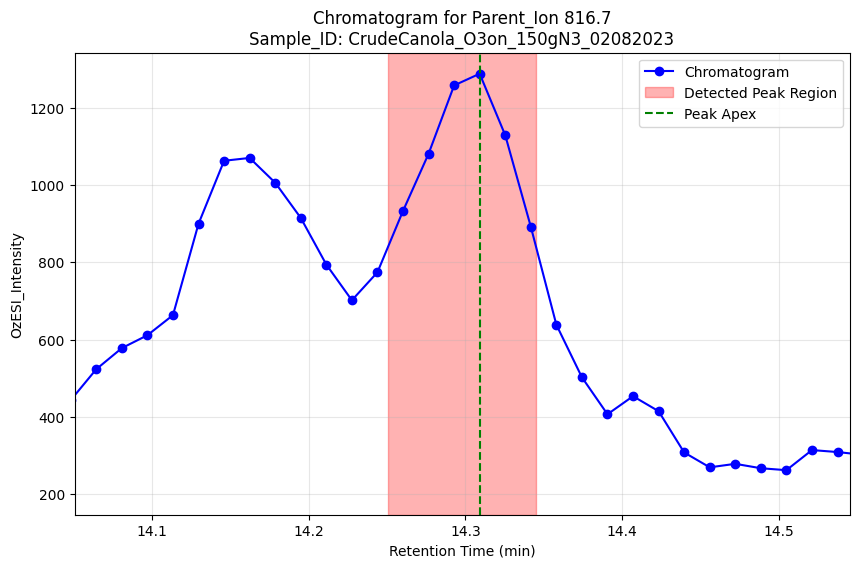


Peak Details for CrudeCanola_O3on_150gN3_02082023:
Start Time: 14.25 min
Apex Time: 14.31 min
End Time: 14.35 min
Peak Width: 0.09 min
Peak Area: 103.79


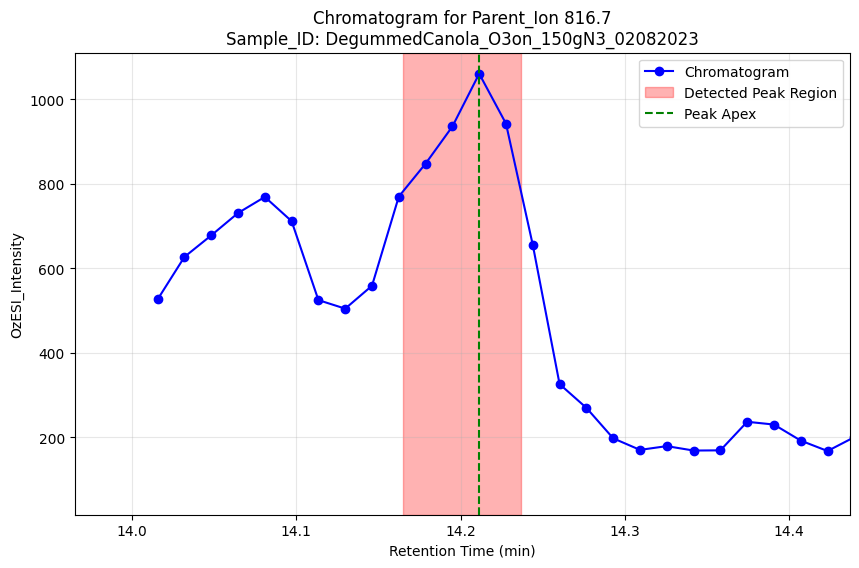


Peak Details for DegummedCanola_O3on_150gN3_02082023:
Start Time: 14.17 min
Apex Time: 14.21 min
End Time: 14.24 min
Peak Width: 0.07 min
Peak Area: 66.12


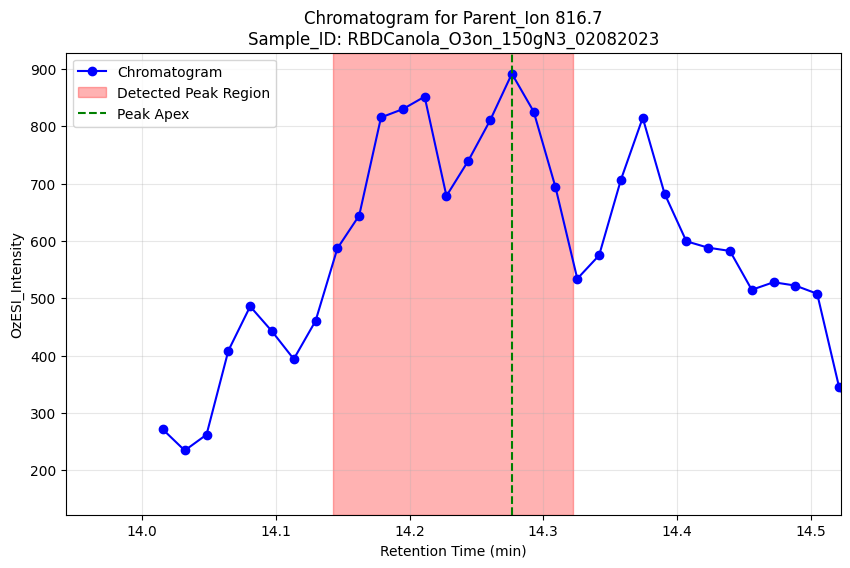


Peak Details for RBDCanola_O3on_150gN3_02082023:
Start Time: 14.14 min
Apex Time: 14.28 min
End Time: 14.32 min
Peak Width: 0.18 min
Peak Area: 136.16
                             Sample_ID          Peak_Start  Peak_Apex  \
0     CrudeCanola_O3on_150gN3_02082023  14.250650257254291  14.309133   
1  DegummedCanola_O3on_150gN3_02082023  14.165049062492905  14.211317   
2       RBDCanola_O3on_150gN3_02082023  14.142974705579837  14.276533   

            Peak_Stop  Peak_Width   Peak_Area  Peak_Intensity  
0    14.3451248200177    0.094475  103.785343     1287.480103  
1  14.236699465913228    0.071650   66.122035     1060.780029  
2   14.32248784889249    0.179513  136.155677      891.480042  


In [13]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.signal import find_peaks, peak_widths
from scipy.interpolate import interp1d

# Define the target Parent_Ion and list of Sample_IDs
target_parent_ion = 816.7
sample_ids = [
    'CrudeCanola_O3on_150gN3_02082023',
    'DegummedCanola_O3on_150gN3_02082023',
    'RBDCanola_O3on_150gN3_02082023'
]

# Define time cutoffs: minimum and maximum retention times
time_min = 14.0
time_max = 15.0

# List to hold results for each sample
results = []

for sample in sample_ids:
    # Filter the DataFrame for the desired Parent_Ion, Sample_ID,
    # and only include data points between time_min and time_max.
    subset = processed_df[
        (processed_df['Parent_Ion'] == target_parent_ion) & 
        (processed_df['Sample_ID'] == sample) &
        (processed_df['Retention_Time'] >= time_min) &
        (processed_df['Retention_Time'] <= time_max)
    ].copy()

    # Sort by Retention_Time for proper ordering
    subset.sort_values('Retention_Time', inplace=True)
    
    if subset.empty:
        print(f"No data found for {sample} in the time range {time_min} to {time_max} min.")
        continue

    # Extract retention time and intensity arrays
    retention_times = subset['Retention_Time'].values
    intensities = subset['OzESI_Intensity'].values

    # Detect peaks using SciPy's find_peaks with chosen parameters.
    peaks, properties = find_peaks(
        intensities,
        height=500,       # Only consider peaks above an intensity of 500
        prominence=300,   # Require a minimum prominence of 300
        distance=5        # Ensure peaks are at least 5 data points apart
    )
    
    if len(peaks) == 0:
        print(f"No peaks detected for {sample}.")
        continue

    # From the detected peaks, select the one with the highest intensity.
    peak_index = peaks[np.argmax(intensities[peaks])]
    peak_intensity = intensities[peak_index]
    peak_apex = retention_times[peak_index]

    # Determine the peak boundaries at half maximum using peak_widths.
    widths, h_eval, left_ips, right_ips = peak_widths(intensities, [peak_index], rel_height=0.5)
    
    # Create an interpolation function to convert fractional indices to actual retention times.
    indices = np.arange(len(retention_times))
    interp_func = interp1d(indices, retention_times)
    peak_start = interp_func(left_ips[0])
    peak_stop = interp_func(right_ips[0])
    
    # Calculate the peak area using numerical integration (np.trapz).
    mask = (retention_times >= peak_start) & (retention_times <= peak_stop)
    x_integration = retention_times[mask]
    y_integration = intensities[mask]
    
    # Include the exact boundaries (with intensity equal to the half maximum level)
    x_values = np.concatenate(([peak_start], x_integration, [peak_stop]))
    y_values = np.concatenate(([h_eval[0]], y_integration, [h_eval[0]]))
    peak_area = np.trapz(y_values, x_values)
    
    # Save results for the current sample.
    results.append({
        'Sample_ID': sample,
        'Peak_Start': peak_start,
        'Peak_Apex': peak_apex,
        'Peak_Stop': peak_stop,
        'Peak_Width': peak_stop - peak_start,
        'Peak_Area': peak_area,
        'Peak_Intensity': peak_intensity
    })
    
    # Plot the chromatogram and the detected peak region.
    plt.figure(figsize=(10, 6))
    plt.plot(retention_times, intensities, marker='o', linestyle='-', color='blue', label='Chromatogram')
    plt.axvspan(peak_start, peak_stop, color='red', alpha=0.3, label='Detected Peak Region')
    plt.axvline(peak_apex, color='green', linestyle='--', label='Peak Apex')
    
    # Zoom in around the peak with some padding.
    time_buffer = 0.2  # minutes before and after the peak boundaries
    plt.xlim(peak_start - time_buffer, peak_stop + time_buffer)
    
    plt.xlabel("Retention Time (min)")
    plt.ylabel("OzESI_Intensity")
    plt.title(f"Chromatogram for Parent_Ion {target_parent_ion}\nSample_ID: {sample}")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
    
    # Print peak details for this sample.
    print(f"\nPeak Details for {sample}:")
    print(f"Start Time: {peak_start:.2f} min")
    print(f"Apex Time: {peak_apex:.2f} min")
    print(f"End Time: {peak_stop:.2f} min")
    print(f"Peak Width: {peak_stop - peak_start:.2f} min")
    print(f"Peak Area: {peak_area:.2f}")

# Create a DataFrame with the results from all samples and print it.
results_df = pd.DataFrame(results)
print(results_df)


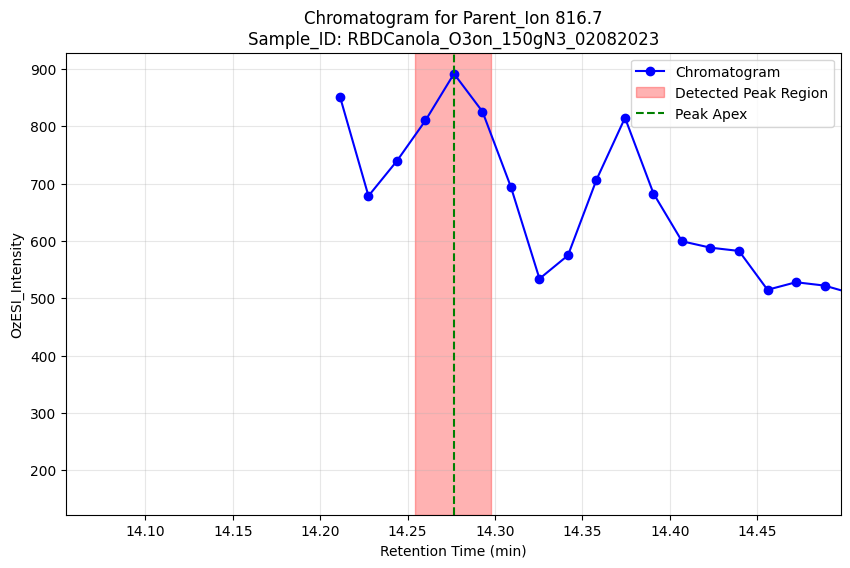


Peak Details for RBDCanola_O3on_150gN3_02082023:
Start Time: 14.25 min
Apex Time: 14.28 min
End Time: 14.30 min
Peak Width: 0.04 min
Peak Area: 36.53
                        Sample_ID         Peak_Start  Peak_Apex  \
0  RBDCanola_O3on_150gN3_02082023  14.25442203338924  14.276533   

            Peak_Stop  Peak_Width  Peak_Area  Peak_Intensity  
0  14.297849851392918    0.043428   36.53388      891.480042  


In [14]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.signal import find_peaks, peak_widths
from scipy.interpolate import interp1d

# Define the target Parent_Ion and list of Sample_IDs
target_parent_ion = 816.7
sample_ids = [
    'RBDCanola_O3on_150gN3_02082023'
]

# Define time cutoffs: minimum and maximum retention time
time_min = 14.2
time_max = 15.0

# List to hold results for each sample
results = []

for sample in sample_ids:
    # Filter the DataFrame for the desired Parent_Ion, Sample_ID,
    # and only include data points between time_min and time_max.
    subset = processed_df[
        (processed_df['Parent_Ion'] == target_parent_ion) & 
        (processed_df['Sample_ID'] == sample) &
        (processed_df['Retention_Time'] >= time_min) &
        (processed_df['Retention_Time'] <= time_max)
    ].copy()

    # Sort by Retention_Time for proper ordering
    subset.sort_values('Retention_Time', inplace=True)
    
    if subset.empty:
        print(f"No data found for {sample} in the time range {time_min} to {time_max} min.")
        continue

    # Extract retention time and intensity arrays
    retention_times = subset['Retention_Time'].values
    intensities = subset['OzESI_Intensity'].values

    # Detect peaks using SciPy's find_peaks with chosen parameters.
    peaks, properties = find_peaks(
        intensities,
        height=200,       # Only consider peaks above an intensity of 500
        prominence=50,   # Require a minimum prominence of 300
        distance=5        # Ensure peaks are at least 5 data points apart
    )
    
    if len(peaks) == 0:
        print(f"No peaks detected for {sample}.")
        continue

    # From the detected peaks, select the one with the highest intensity.
    peak_index = peaks[np.argmax(intensities[peaks])]
    peak_intensity = intensities[peak_index]
    peak_apex = retention_times[peak_index]

    # Determine the peak boundaries at half maximum using peak_widths.
    widths, h_eval, left_ips, right_ips = peak_widths(intensities, [peak_index], rel_height=0.5)
    
    # Create an interpolation function to convert fractional indices to actual retention times.
    indices = np.arange(len(retention_times))
    interp_func = interp1d(indices, retention_times)
    peak_start = interp_func(left_ips[0])
    peak_stop = interp_func(right_ips[0])
    
    # Calculate the peak area using numerical integration (np.trapz).
    mask = (retention_times >= peak_start) & (retention_times <= peak_stop)
    x_integration = retention_times[mask]
    y_integration = intensities[mask]
    
    # Include the exact boundaries (with intensity equal to the half maximum level)
    x_values = np.concatenate(([peak_start], x_integration, [peak_stop]))
    y_values = np.concatenate(([h_eval[0]], y_integration, [h_eval[0]]))
    peak_area = np.trapz(y_values, x_values)
    
    # Save results for the current sample.
    results.append({
        'Sample_ID': sample,
        'Peak_Start': peak_start,
        'Peak_Apex': peak_apex,
        'Peak_Stop': peak_stop,
        'Peak_Width': peak_stop - peak_start,
        'Peak_Area': peak_area,
        'Peak_Intensity': peak_intensity
    })
    
    # Plot the chromatogram and the detected peak region.
    plt.figure(figsize=(10, 6))
    plt.plot(retention_times, intensities, marker='o', linestyle='-', color='blue', label='Chromatogram')
    plt.axvspan(peak_start, peak_stop, color='red', alpha=0.3, label='Detected Peak Region')
    plt.axvline(peak_apex, color='green', linestyle='--', label='Peak Apex')
    
    # Zoom in around the peak with some padding.
    time_buffer = 0.2  # minutes before and after the peak boundaries
    plt.xlim(peak_start - time_buffer, peak_stop + time_buffer)
    
    plt.xlabel("Retention Time (min)")
    plt.ylabel("OzESI_Intensity")
    plt.title(f"Chromatogram for Parent_Ion {target_parent_ion}\nSample_ID: {sample}")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
    
    # Print peak details for this sample.
    print(f"\nPeak Details for {sample}:")
    print(f"Start Time: {peak_start:.2f} min")
    print(f"Apex Time: {peak_apex:.2f} min")
    print(f"End Time: {peak_stop:.2f} min")
    print(f"Peak Width: {peak_stop - peak_start:.2f} min")
    print(f"Peak Area: {peak_area:.2f}")

# Create a DataFrame with the results from all samples and print it.
results_df = pd.DataFrame(results)
print(results_df)


Selected peak area: 125.7262856791153


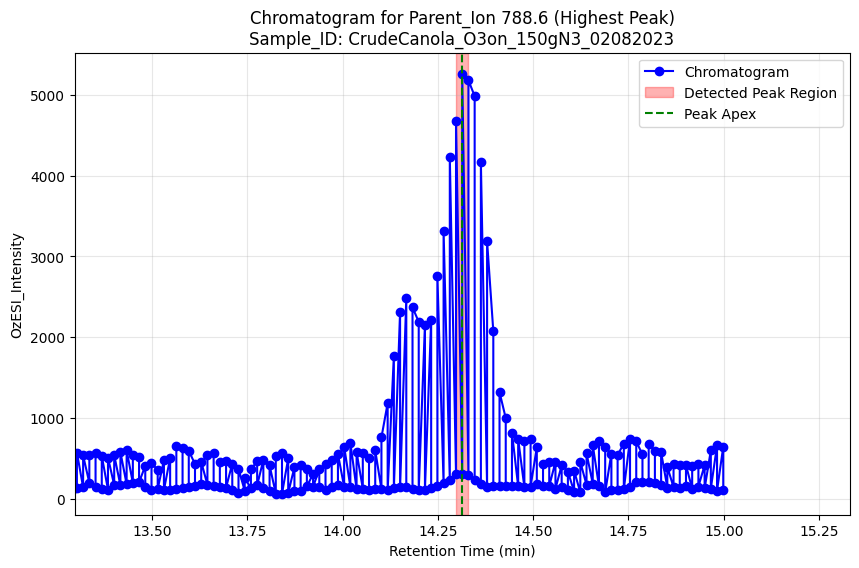


Peak Details:
Start Time: 14.30 min
Apex Time: 14.31 min
End Time: 14.33 min
Peak Width: 0.03 min


In [15]:
import matplotlib.pyplot as plt
import pandas as pd

# Define the target Parent_Ion and Sample_ID
target_parent_ion = 788.6
target_sample = 'CrudeCanola_O3on_150gN3_02082023'

# Filter the processed DataFrame for the desired Parent_Ion, Sample_ID, and retention time window (14 to 15 minutes)
subset = processed_df[
    (processed_df['Parent_Ion'] == target_parent_ion) &
    (processed_df['Sample_ID'] == target_sample) &
    (processed_df['Retention_Time'] >= 13) &
    (processed_df['Retention_Time'] <= 15)
].copy()

# Group by peak information and find the peak with maximum area
if 'peak_area' in subset.columns and subset['peak_start'].notna().any():
    # Get unique peaks and their areas
    peak_info = subset[['peak_start', 'peak_stop', 'peak_middle', 'peak_area']].drop_duplicates()
    
    # Find the peak with maximum area
    max_peak = peak_info.loc[peak_info['peak_area'].idxmax()]
    peak_start = max_peak['peak_start']
    peak_stop = max_peak['peak_stop']
    peak_middle = max_peak['peak_middle']
    
    print(f"Selected peak area: {max_peak['peak_area']}")
else:
    raise ValueError("No peak information or peak area available for Parent_Ion {} and Sample_ID {}".format(
        target_parent_ion, target_sample
    ))

# Create the plot
plt.figure(figsize=(10, 6))

# Plot the full chromatogram
plt.plot(subset['Retention_Time'], subset['OzESI_Intensity'],
         marker='o', linestyle='-', color='blue', label='Chromatogram')

# Highlight the detected peak region using a shaded area
plt.axvspan(peak_start, peak_stop, color='red', alpha=0.3, label='Detected Peak Region')

# Mark the peak apex with a vertical dashed line
plt.axvline(peak_middle, color='green', linestyle='--', label='Peak Apex')

# Zoom in around the peak with some padding
time_buffer = 1.0  # minutes before and after peak
plt.xlim(peak_start - time_buffer, peak_stop + time_buffer)

# Add labels and title
plt.xlabel("Retention Time (min)")
plt.ylabel("OzESI_Intensity")
plt.title("Chromatogram for Parent_Ion {} (Highest Peak)\nSample_ID: {}".format(
    target_parent_ion, target_sample))
plt.legend()

# Add grid for better readability
plt.grid(True, alpha=0.3)

# Show the plot
plt.show()

# Print peak details
print("\nPeak Details:")
print(f"Start Time: {peak_start:.2f} min")
print(f"Apex Time: {peak_middle:.2f} min")
print(f"End Time: {peak_stop:.2f} min")
print(f"Peak Width: {peak_stop - peak_start:.2f} min")


# This works for removing the random extra noise data which is messing up the peaks

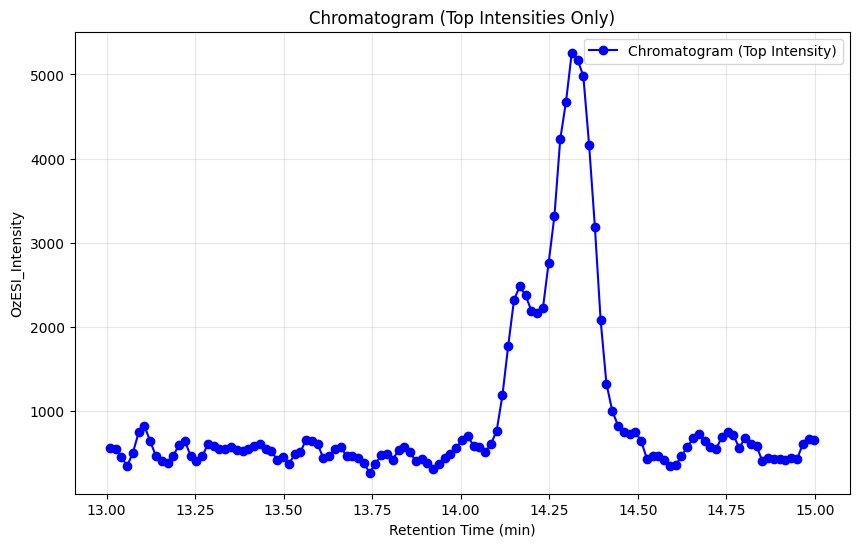

In [16]:
import matplotlib.pyplot as plt
import pandas as pd

# Suppose your original DataFrame is called `subset`
# 1. Group by Retention_Time and take the maximum OzESI_Intensity
subset_top = (
    subset
    .groupby('Retention_Time', as_index=False)['OzESI_Intensity']
    .max()
)

# 2. Plot only the aggregated data (top intensities)
plt.figure(figsize=(10, 6))
plt.plot(
    subset_top['Retention_Time'],
    subset_top['OzESI_Intensity'],
    marker='o',
    linestyle='-',
    color='blue',
    label='Chromatogram (Top Intensity)'
)

plt.xlabel("Retention Time (min)")
plt.ylabel("OzESI_Intensity")
plt.title("Chromatogram (Top Intensities Only)")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()


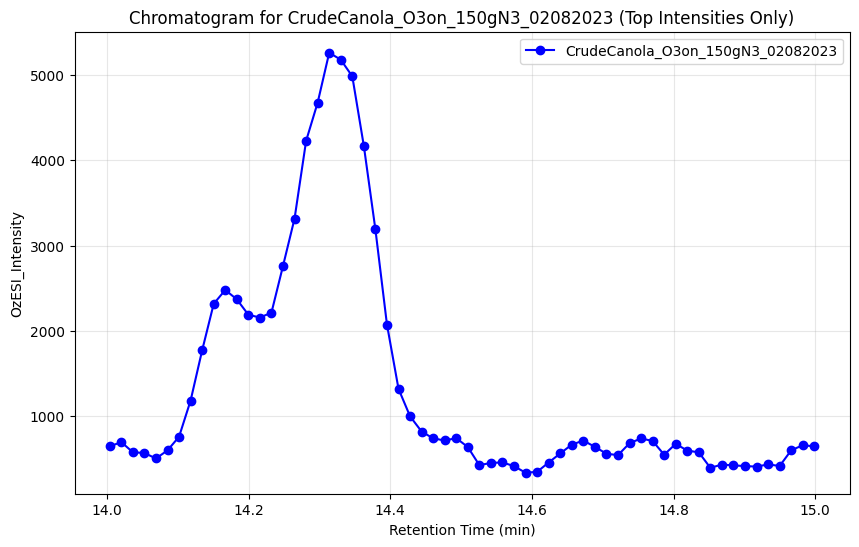

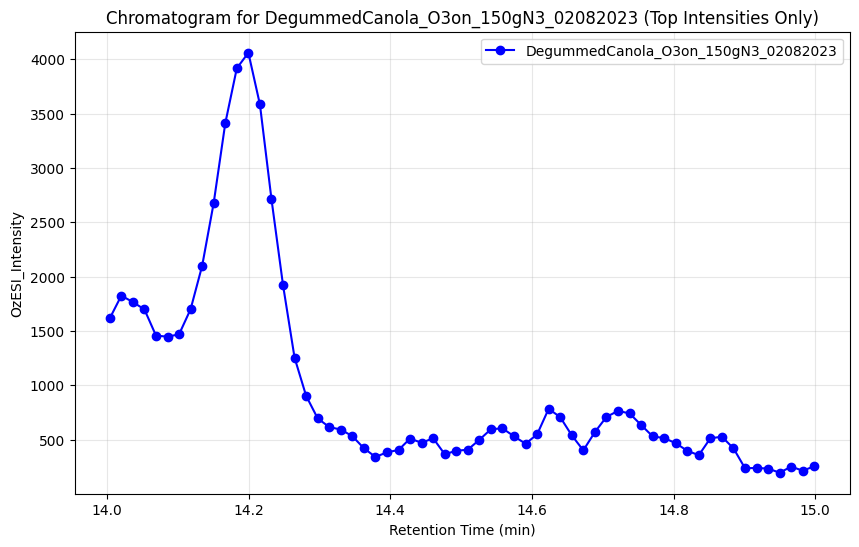

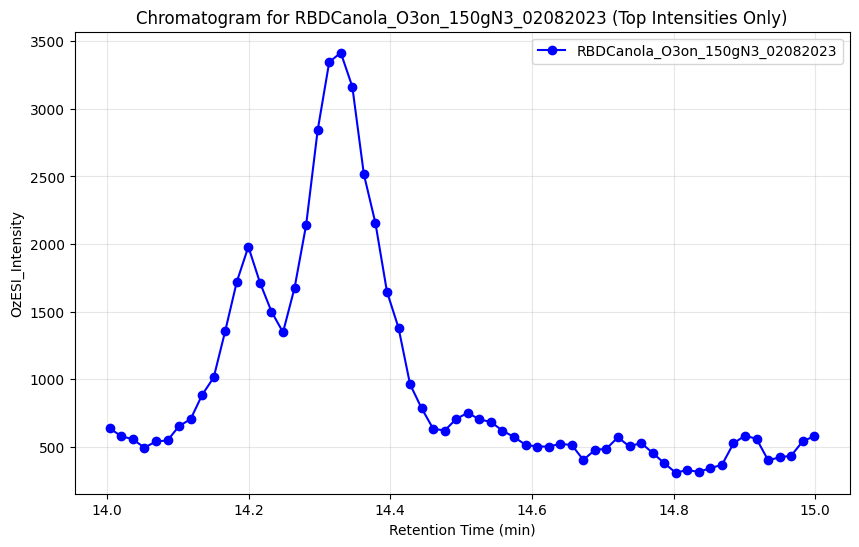

                             Sample_ID    Peak_Area  Max_Intensity
0     CrudeCanola_O3on_150gN3_02082023  1340.531034    5259.140137
1  DegummedCanola_O3on_150gN3_02082023   974.122311    4061.100342
2       RBDCanola_O3on_150gN3_02082023   963.188023    3415.200195


In [17]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Define target parent ion and sample IDs
target_parent_ion = 788.6
sample_ids = [
    'CrudeCanola_O3on_150gN3_02082023',
    'DegummedCanola_O3on_150gN3_02082023',
    'RBDCanola_O3on_150gN3_02082023'
]

# List to hold our summary results
results = []

# Loop over each sample
for sample in sample_ids:
    # Filter the processed DataFrame for the given sample, parent ion, and retention time window 14-15 minutes
    subset = processed_df[
        (processed_df['Parent_Ion'] == target_parent_ion) &
        (processed_df['Sample_ID'] == sample) &
        (processed_df['Retention_Time'] >= 14) &
        (processed_df['Retention_Time'] <= 15)
    ].copy()
    
    # Group by Retention_Time and take the maximum OzESI_Intensity
    # This ensures we keep only the top (blue) intensity at each time point.
    aggregated = subset.groupby('Retention_Time', as_index=False)['OzESI_Intensity'].max()
    aggregated.sort_values('Retention_Time', inplace=True)
    
    # Calculate the peak area using np.trapz (numerical integration)
    peak_area = np.trapz(aggregated['OzESI_Intensity'], aggregated['Retention_Time'])
    
    # Get the maximum intensity value in the aggregated data
    max_intensity = aggregated['OzESI_Intensity'].max()
    
    # Save the results for this sample
    results.append({
        'Sample_ID': sample,
        'Peak_Area': peak_area,
        'Max_Intensity': max_intensity
    })
    
    # Optional: Plot the aggregated (top intensity) chromatogram for this sample
    plt.figure(figsize=(10, 6))
    plt.plot(aggregated['Retention_Time'], aggregated['OzESI_Intensity'],
             marker='o', linestyle='-', color='blue', label=f"{sample}")
    plt.xlabel("Retention Time (min)")
    plt.ylabel("OzESI_Intensity")
    plt.title(f"Chromatogram for {sample} (Top Intensities Only)")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

# Create a DataFrame from the results
results_df = pd.DataFrame(results)
print(results_df)


# updated area calc and use scipy peakfinder

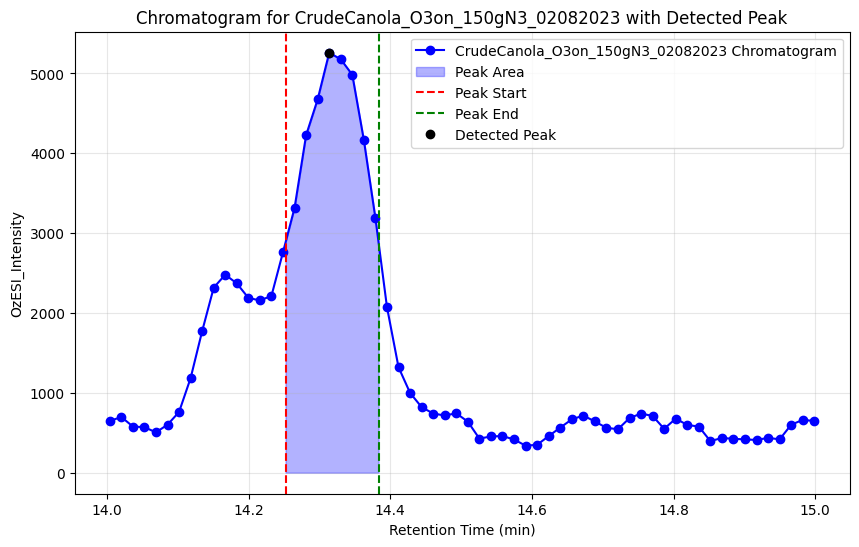

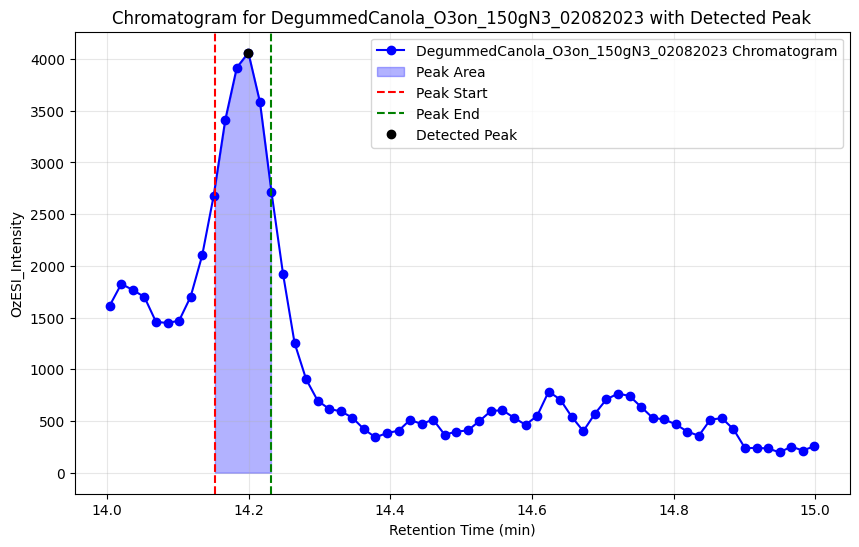

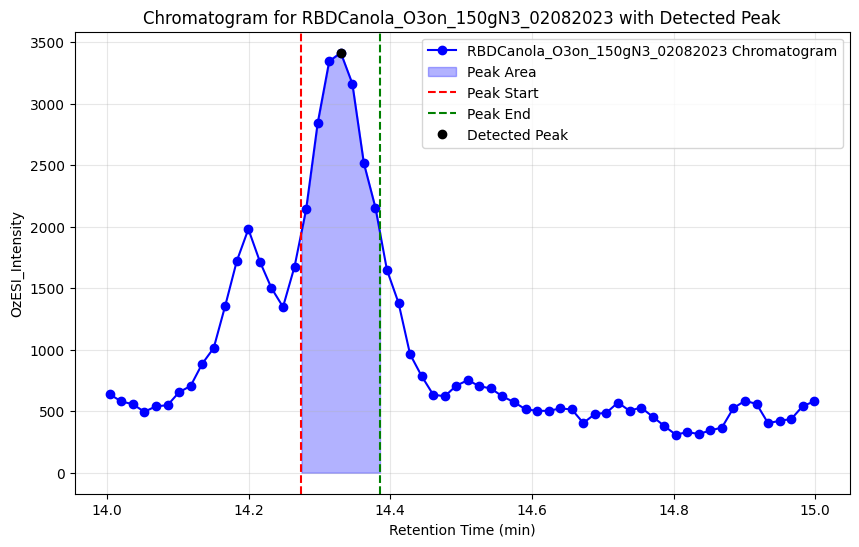

                             Sample_ID   Peak_Area  Max_Intensity  \
0     CrudeCanola_O3on_150gN3_02082023  570.722155    5259.140137   
1  DegummedCanola_O3on_150gN3_02082023  281.616201    4061.100342   
2       RBDCanola_O3on_150gN3_02082023  310.892336    3415.200195   

           Peak_Start           Peak_Stop  
0   14.25212089121672  14.383516288622644  
1  14.152410964426242  14.231530490151183  
2  14.274672490383026  14.385488946356025  


In [97]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.signal import find_peaks, peak_widths
from scipy.interpolate import interp1d

# Define target parent ion and sample IDs
target_parent_ion = 788.6
sample_ids = [
    'CrudeCanola_O3on_150gN3_02082023',
    'DegummedCanola_O3on_150gN3_02082023',
    'RBDCanola_O3on_150gN3_02082023'
]

# List to hold our summary results
results = []

# Loop over each sample
for sample in sample_ids:
    # Filter the processed DataFrame for the given sample, parent ion, and retention time window 14-15 minutes
    subset = processed_df[
        (processed_df['Parent_Ion'] == target_parent_ion) &
        (processed_df['Sample_ID'] == sample) &
        (processed_df['Retention_Time'] >= 14) &
        (processed_df['Retention_Time'] <= 15)
    ].copy()
    
    # Group by Retention_Time and take the maximum OzESI_Intensity
    aggregated = subset.groupby('Retention_Time', as_index=False)['OzESI_Intensity'].max()
    aggregated.sort_values('Retention_Time', inplace=True)
    aggregated = aggregated.reset_index(drop=True)
    
    # Skip if no data is available
    if aggregated.empty:
        print(f"No data for sample {sample} in the specified retention time window.")
        continue

    # Use SciPy to detect peaks in the chromatogram
    intensity_array = aggregated['OzESI_Intensity'].values
    peaks, _ = find_peaks(intensity_array)
    
    if len(peaks) == 0:
        print(f"No peaks found for sample {sample}.")
        continue
    
    # Select the most prominent peak (highest intensity)
    peak_idx = peaks[np.argmax(intensity_array[peaks])]
    peak_intensity = intensity_array[peak_idx]
    
    # Use peak_widths to determine the boundaries at half maximum (rel_height=0.5)
    widths, h_eval, left_ips, right_ips = peak_widths(intensity_array, [peak_idx], rel_height=0.5)
    
    # Create an interpolation function for retention time based on the index positions
    retention_times = aggregated['Retention_Time'].values
    f_interp = interp1d(np.arange(len(retention_times)), retention_times)
    
    # Determine the start and stop times for the peak using the interpolated fractional indices
    peak_start_time = f_interp(left_ips[0])
    peak_stop_time = f_interp(right_ips[0])
    
    # Calculate the area under the peak:
    # Get the subset of data within the peak boundaries.
    mask = (aggregated['Retention_Time'] >= peak_start_time) & (aggregated['Retention_Time'] <= peak_stop_time)
    x_integration = aggregated.loc[mask, 'Retention_Time'].values
    y_integration = aggregated.loc[mask, 'OzESI_Intensity'].values
    
    # To include the exact boundaries (with intensity equal to h_eval), prepend/append them.
    x_values = np.concatenate(([peak_start_time], x_integration, [peak_stop_time]))
    y_values = np.concatenate(([h_eval[0]], y_integration, [h_eval[0]]))
    
    peak_area = np.trapz(y_values, x_values)
    
    # Save the results for this sample
    results.append({
        'Sample_ID': sample,
        'Peak_Area': peak_area,
        'Max_Intensity': peak_intensity,
        'Peak_Start': peak_start_time,
        'Peak_Stop': peak_stop_time
    })
    
    # Plot the aggregated chromatogram for this sample
    plt.figure(figsize=(10, 6))
    plt.plot(aggregated['Retention_Time'], aggregated['OzESI_Intensity'],
             marker='o', linestyle='-', color='blue', label=f"{sample} Chromatogram")
    
    # Shade the area under the detected peak
    plt.fill_between(x_values, y_values, alpha=0.3, color='blue', label="Peak Area")
    
    # Add vertical dashed lines for peak start and stop
    plt.axvline(x=peak_start_time, linestyle="--", color="red", label="Peak Start")
    plt.axvline(x=peak_stop_time, linestyle="--", color="green", label="Peak End")
    
    # Mark the detected peak with a black circle
    plt.plot(retention_times[peak_idx], peak_intensity, 'ko', label="Detected Peak")
    
    plt.xlabel("Retention Time (min)")
    plt.ylabel("OzESI_Intensity")
    plt.title(f"Chromatogram for {sample} with Detected Peak")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

# Create a DataFrame from the results and print it
results_df = pd.DataFrame(results)
print(results_df)


# make peaks a bit wider

Sample: CrudeCanola_O3on_150gN3_02082023
  Peak Start Time: 14.1045 min
  Peak End Time:   14.4434 min
  Peak Width:      0.3389 min



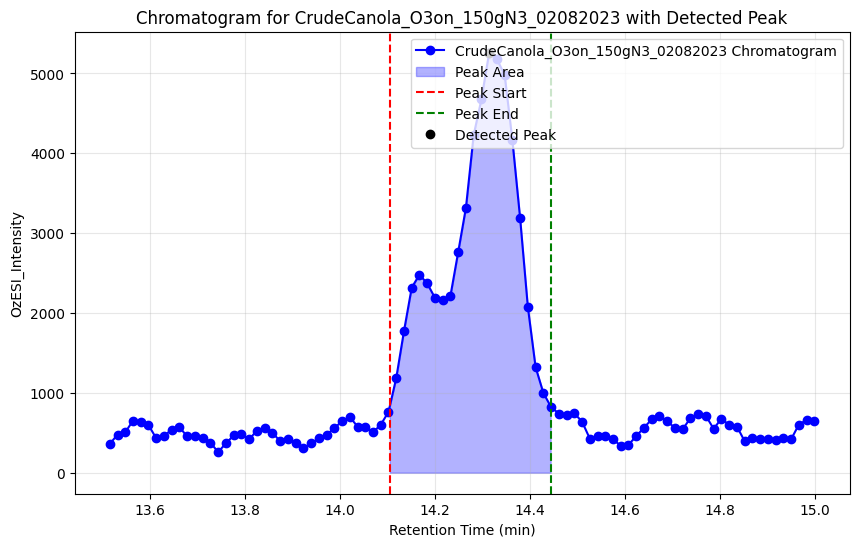

Sample: DegummedCanola_O3on_150gN3_02082023
  Peak Start Time: 13.9687 min
  Peak End Time:   14.2877 min
  Peak Width:      0.3190 min



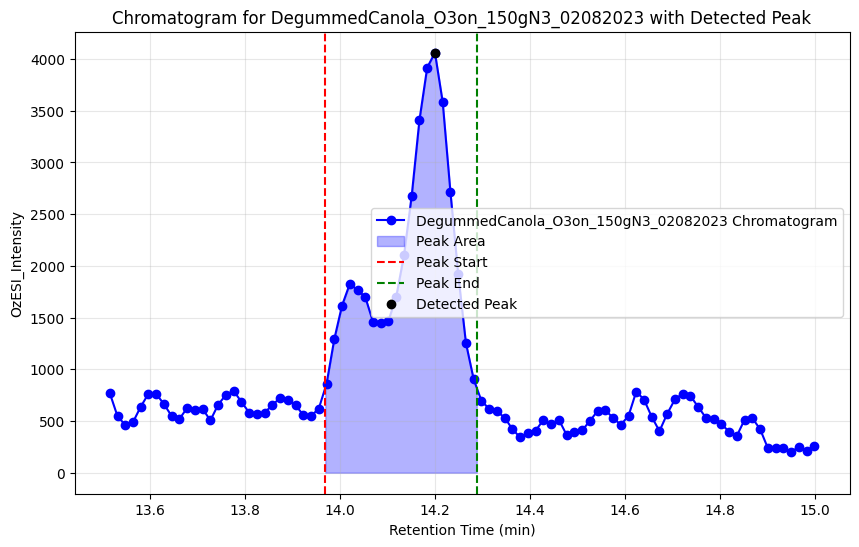

Sample: RBDCanola_O3on_150gN3_02082023
  Peak Start Time: 14.0977 min
  Peak End Time:   14.4691 min
  Peak Width:      0.3714 min



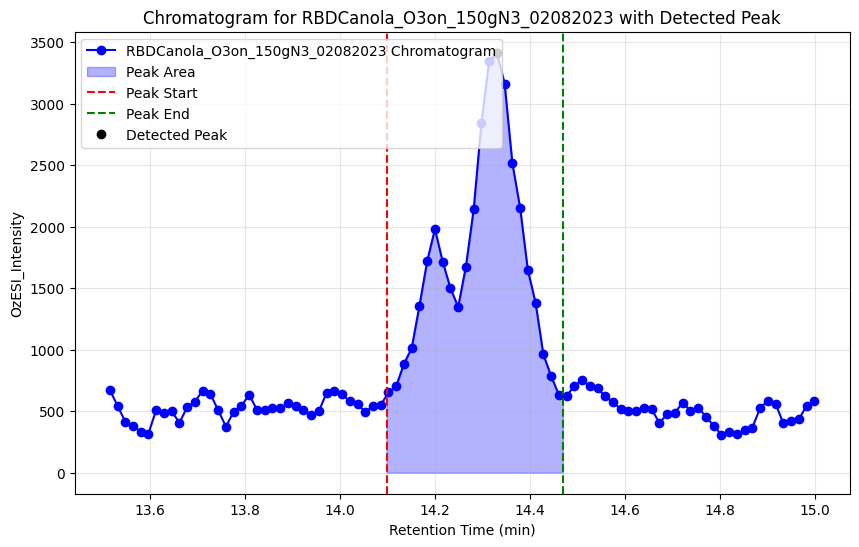

,Sample_ID,Peak_Area,Max_Intensity,Peak_Start,Peak_Stop
0,CrudeCanola_O3on_150gN3_02082023,969.490512,5259.140137,14.104503828116522,14.443389298459454
1,DegummedCanola_O3on_150gN3_02082023,673.318173,4061.100342,13.96873258091015,14.287708074389023
2,RBDCanola_O3on_150gN3_02082023,642.601115,3415.200195,14.09770551598492,14.4691045453914


In [62]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.signal import find_peaks, peak_widths
from scipy.interpolate import interp1d
from scipy.ndimage import gaussian_filter1d

# Define target parent ion and sample IDs
target_parent_ion = 788.6
sample_ids = [
    'CrudeCanola_O3on_150gN3_02082023',
    'DegummedCanola_O3on_150gN3_02082023',
    'RBDCanola_O3on_150gN3_02082023'
]

# List to hold our summary results
results = []

# Loop over each sample
for sample in sample_ids:
    # Filter the processed DataFrame for the given sample, parent ion, and retention time window 14-15 minutes
    subset = processed_df[
        (processed_df['Parent_Ion'] == target_parent_ion) &
        (processed_df['Sample_ID'] == sample) &
        (processed_df['Retention_Time'] >= 13.5) &
        (processed_df['Retention_Time'] <= 15)
    ].copy()
    
    # Group by Retention_Time and take the maximum OzESI_Intensity
    aggregated = subset.groupby('Retention_Time', as_index=False)['OzESI_Intensity'].max()
    aggregated.sort_values('Retention_Time', inplace=True)
    aggregated = aggregated.reset_index(drop=True)
    
    # Skip if no data is available
    if aggregated.empty:
        print(f"No data for sample {sample} in the specified retention time window.")
        continue

    # Prepare intensity array
    intensity_array = aggregated['OzESI_Intensity'].values
    
    # Optional smoothing (uncomment to apply)
    # intensity_array = gaussian_filter1d(intensity_array, sigma=1.0)

    # Use SciPy to detect peaks in the chromatogram
    peaks, _ = find_peaks(intensity_array)
    
    if len(peaks) == 0:
        print(f"No peaks found for sample {sample}.")
        continue
    
    # Select the most prominent peak (highest intensity)
    peak_idx = peaks[np.argmax(intensity_array[peaks])]
    peak_intensity = intensity_array[peak_idx]
    
    # Use peak_widths to determine the boundaries at 30% height (rel_height=0.3)
    widths, h_eval, left_ips, right_ips = peak_widths(intensity_array, [peak_idx], rel_height=0.9)
    
    # Create an interpolation function for retention time based on the index positions
    retention_times = aggregated['Retention_Time'].values
    f_interp = interp1d(np.arange(len(retention_times)), retention_times)
    
    # Determine the start and stop times for the peak using the interpolated fractional indices
    peak_start_time = f_interp(left_ips[0])
    peak_stop_time = f_interp(right_ips[0])
    
    # Calculate the area under the peak:
    mask = (aggregated['Retention_Time'] >= peak_start_time) & (aggregated['Retention_Time'] <= peak_stop_time)
    x_integration = aggregated.loc[mask, 'Retention_Time'].values
    y_integration = aggregated.loc[mask, 'OzESI_Intensity'].values

    # Include the exact boundary values
    x_values = np.concatenate(([peak_start_time], x_integration, [peak_stop_time]))
    y_values = np.concatenate(([h_eval[0]], y_integration, [h_eval[0]]))
    
    peak_area = np.trapz(y_values, x_values)
    
    # Save the results for this sample
    results.append({
        'Sample_ID': sample,
        'Peak_Area': peak_area,
        'Max_Intensity': peak_intensity,
        'Peak_Start': peak_start_time,
        'Peak_Stop': peak_stop_time
    })

    # Print peak summary
    print(f"Sample: {sample}")
    print(f"  Peak Start Time: {peak_start_time:.4f} min")
    print(f"  Peak End Time:   {peak_stop_time:.4f} min")
    print(f"  Peak Width:      {peak_stop_time - peak_start_time:.4f} min\n")
    
    # Plot the aggregated chromatogram for this sample
    plt.figure(figsize=(10, 6))
    plt.plot(aggregated['Retention_Time'], intensity_array,
             marker='o', linestyle='-', color='blue', label=f"{sample} Chromatogram")
    
    # Shade the area under the detected peak
    plt.fill_between(x_values, y_values, alpha=0.3, color='blue', label="Peak Area")
    
    # Add vertical dashed lines for peak start and stop
    plt.axvline(x=peak_start_time, linestyle="--", color="red", label="Peak Start")
    plt.axvline(x=peak_stop_time, linestyle="--", color="green", label="Peak End")
    
    # Mark the detected peak with a black circle
    plt.plot(retention_times[peak_idx], peak_intensity, 'ko', label="Detected Peak")
    
    plt.xlabel("Retention Time (min)")
    plt.ylabel("OzESI_Intensity")
    plt.title(f"Chromatogram for {sample} with Detected Peak")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

# Create a DataFrame from the results and print it
results_df = pd.DataFrame(results)
results_df

# n7

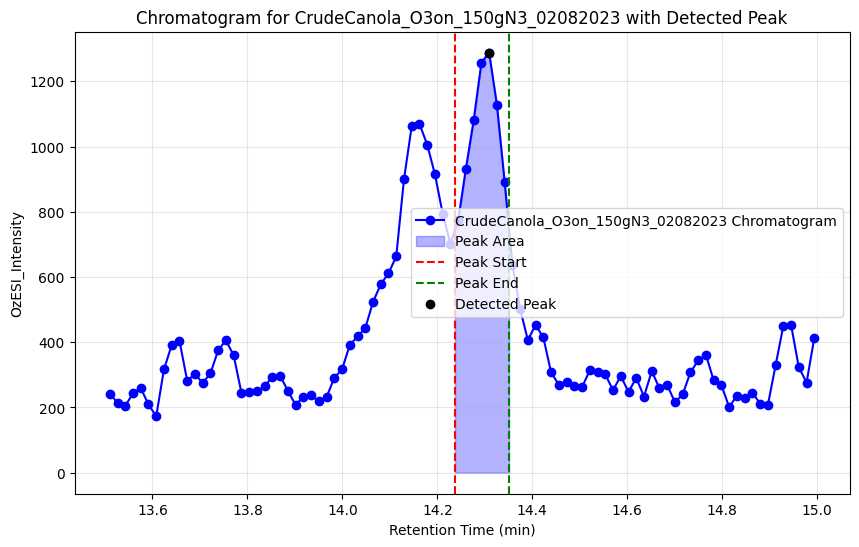

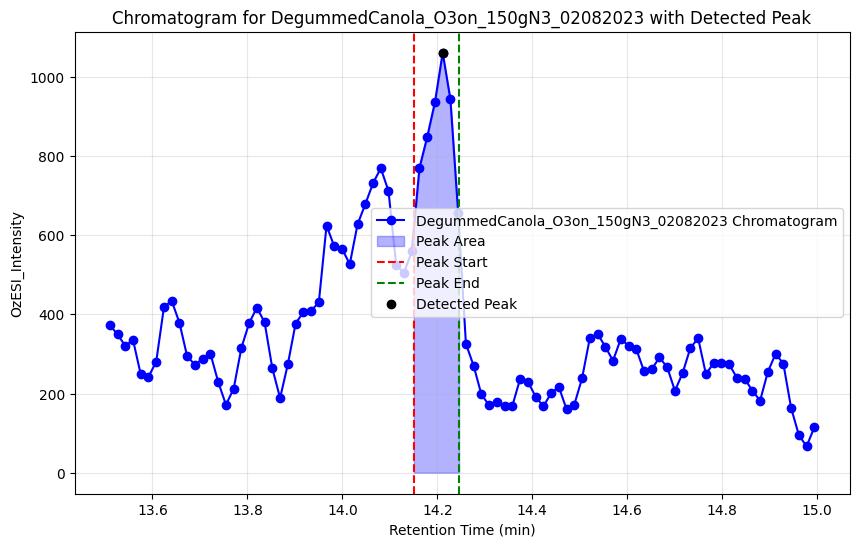

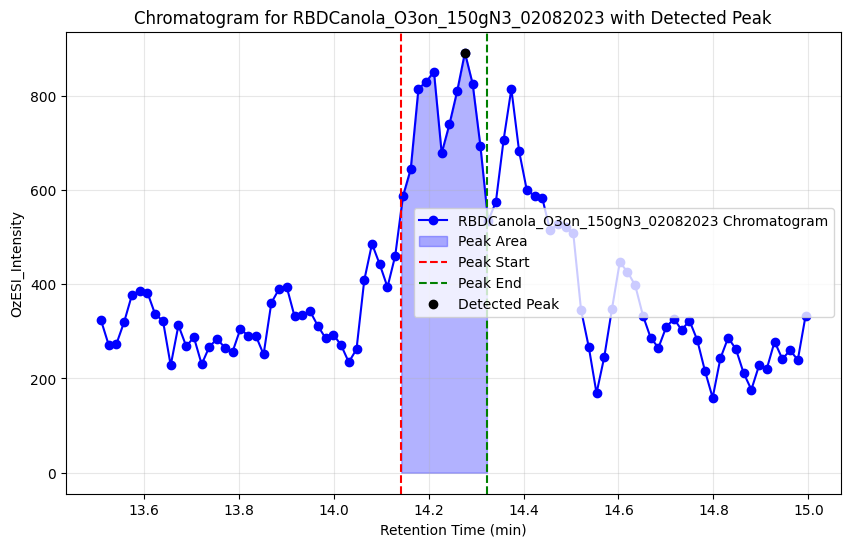

                             Sample_ID   Peak_Area  Max_Intensity  \
0     CrudeCanola_O3on_150gN3_02082023  119.131259    1287.480103   
1  DegummedCanola_O3on_150gN3_02082023   82.849627    1060.780029   
2       RBDCanola_O3on_150gN3_02082023  136.591725     891.480042   

           Peak_Start           Peak_Stop  
0  14.237239623124127  14.351243729929928  
1  14.150512604719273  14.245868131516273  
2   14.14254110854646  14.322831049820447  


In [70]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.signal import find_peaks, peak_widths
from scipy.interpolate import interp1d

# Define target parent ion and sample IDs
target_parent_ion = 816.7
sample_ids = [
    'CrudeCanola_O3on_150gN3_02082023',
    'DegummedCanola_O3on_150gN3_02082023',
    'RBDCanola_O3on_150gN3_02082023'
]

# List to hold our summary results
results = []

# Loop over each sample
for sample in sample_ids:
    # Filter the processed DataFrame for the given sample, parent ion, and retention time window 14-15 minutes
    subset = processed_df[
        (processed_df['Parent_Ion'] == target_parent_ion) &
        (processed_df['Sample_ID'] == sample) &
        (processed_df['Retention_Time'] >= 13.5) &
        (processed_df['Retention_Time'] <= 15)
    ].copy()
    
    # Group by Retention_Time and take the maximum OzESI_Intensity
    aggregated = subset.groupby('Retention_Time', as_index=False)['OzESI_Intensity'].max()
    aggregated.sort_values('Retention_Time', inplace=True)
    aggregated = aggregated.reset_index(drop=True)
    
    # Skip if no data is available
    if aggregated.empty:
        print(f"No data for sample {sample} in the specified retention time window.")
        continue

    # Use SciPy to detect peaks in the chromatogram
    intensity_array = aggregated['OzESI_Intensity'].values
    peaks, _ = find_peaks(intensity_array)
    
    if len(peaks) == 0:
        print(f"No peaks found for sample {sample}.")
        continue
    
    # Select the most prominent peak (highest intensity)
    peak_idx = peaks[np.argmax(intensity_array[peaks])]
    peak_intensity = intensity_array[peak_idx]
    
    # Use peak_widths to determine the boundaries at half maximum (rel_height=0.5)
    widths, h_eval, left_ips, right_ips = peak_widths(intensity_array, [peak_idx], rel_height=0.5)
    
    # Create an interpolation function for retention time based on the index positions
    retention_times = aggregated['Retention_Time'].values
    f_interp = interp1d(np.arange(len(retention_times)), retention_times)
    
    # Determine the start and stop times for the peak using the interpolated fractional indices
    peak_start_time = f_interp(left_ips[0])
    peak_stop_time = f_interp(right_ips[0])
    
    # Calculate the area under the peak:
    # Get the subset of data within the peak boundaries.
    mask = (aggregated['Retention_Time'] >= peak_start_time) & (aggregated['Retention_Time'] <= peak_stop_time)
    x_integration = aggregated.loc[mask, 'Retention_Time'].values
    y_integration = aggregated.loc[mask, 'OzESI_Intensity'].values
    
    # To include the exact boundaries (with intensity equal to h_eval), prepend/append them.
    x_values = np.concatenate(([peak_start_time], x_integration, [peak_stop_time]))
    y_values = np.concatenate(([h_eval[0]], y_integration, [h_eval[0]]))
    
    peak_area = np.trapz(y_values, x_values)
    
    # Save the results for this sample
    results.append({
        'Sample_ID': sample,
        'Peak_Area': peak_area,
        'Max_Intensity': peak_intensity,
        'Peak_Start': peak_start_time,
        'Peak_Stop': peak_stop_time
    })
    
    # Plot the aggregated chromatogram for this sample
    plt.figure(figsize=(10, 6))
    plt.plot(aggregated['Retention_Time'], aggregated['OzESI_Intensity'],
             marker='o', linestyle='-', color='blue', label=f"{sample} Chromatogram")
    
    # Shade the area under the detected peak
    plt.fill_between(x_values, y_values, alpha=0.3, color='blue', label="Peak Area")
    
    # Add vertical dashed lines for peak start and stop
    plt.axvline(x=peak_start_time, linestyle="--", color="red", label="Peak Start")
    plt.axvline(x=peak_stop_time, linestyle="--", color="green", label="Peak End")
    
    # Mark the detected peak with a black circle
    plt.plot(retention_times[peak_idx], peak_intensity, 'ko', label="Detected Peak")
    
    plt.xlabel("Retention Time (min)")
    plt.ylabel("OzESI_Intensity")
    plt.title(f"Chromatogram for {sample} with Detected Peak")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

# Create a DataFrame from the results and print it
results_df = pd.DataFrame(results)
print(results_df)


### Main Processing Section - Lipidomics Data Processing and Double-Bond Location Analysis

The code block initiates the data refining process by filtering the retention time from the `df_oz_matched` DataFrame using the `filter_rt()` function and concatenating this DataFrame with `df_matched` via `concat_dataframes()`. The resulting DataFrame is then enriched by adding the positional isomers and lipid information for specified double bond positions (here, 7, 9, 12) through the `DB_Position_df()` and `add_lipid_info()` functions respectively. Following sorting by 'Sample_ID' and 'Product_Ion', the `calculate_intensity_ratio()` function is employed to calculate and append intensity ratios to the DataFrame. Afterward, lipid species in the 'Lipid' column are sorted by their second triacylglycerol (TG) components. Lastly, the `filter_highest_ratios()` function is used to filter and keep rows with the highest intensity ratios, resulting in a more concise and useful DataFrame `df_matched_6`.

In [19]:
# Import the OzESIFilter class from the OzESIFilter.py file
from OzESI_filter import OzESIFilter

# Create an instance of OzESIFilter with a tolerance of 0.3
oz_filter = OzESIFilter(tolerance=0.3)

# Run all filtering steps in one call.
# (Ensure that df_OzESI_matched is defined in your notebook.)
final_df = oz_filter.run_all(
    df=processed_df, #df_OzESI_matched
    min_rt=10,
    max_rt=23,
    min_intensity=100,
    db_pos_list=[7, 9, 12],
    sort_by_columns=['Sample_ID', 'Product_Ion'],
    save_csv_path='Projects/canola/results/df_OzESI_5_ratio_peakarea_09feb25.csv'
)

# Display the final processed DataFrame.
final_df


,Class,Lipid,OzESI_Intensity,Parent_Ion,Product_Ion,Retention_Time,Sample_ID,Transition,peak_area,peak_start,peak_stop,peak_middle,is_special_case,n-7,n-9,n-12,db_pos,Ratio
111,NaN,TG(52:2)]_FA18:1,16153.0,766.7,577.596,18.05,CrudeCanola_O3on_150gN3_02082023,766.7 -> 577.596,3049.045013,17.451117,18.651117,18.051117,0,684.7,656.7,614.7,n-9,4.234076
27,TAG,TG(52:2)]_FA18:1,102684.0,876.8,577.596,18.04,CrudeCanola_O3on_150gN3_02082023,876.8 -> 577.596,21397.880364,17.439483,18.639483,18.039483,0,794.8,766.8,724.8,,NaN
171,NaN,TG(52:2)]_FA18:1,3815.0,794.7,577.596,18.05,CrudeCanola_O3on_150gN3_02082023,794.7 -> 577.596,1100.446291,17.445533,18.645533,18.045533,0,712.7,684.7,642.7,n-7,NaN
108,NaN,TG(52:3)]_FA18:1,3420.0,764.6,575.596,16.09,CrudeCanola_O3on_150gN3_02082023,764.6 -> 575.596,1213.646707,15.494617,16.694617,16.094617,0,682.6,654.6,612.6,n-9,3.157895
26,TAG,TG(52:3)]_FA18:1,22411.0,874.8,575.596,16.12,CrudeCanola_O3on_150gN3_02082023,874.8 -> 575.596,6425.437931,15.515617,16.715617,16.115617,0,792.8,764.8,722.8,,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98,TAG,[TG(54:5)]_FA18:1,12850.0,898.8,599.596,14.34,RBDCanola_O3on_150gN3_02082023,898.8 -> 599.596,2680.545731,14.046333,14.641839,14.336167,0,816.8,788.8,746.8,,NaN
369,NaN,[TG(54:5)]_FA18:1,891.0,816.7,599.596,14.28,RBDCanola_O3on_150gN3_02082023,816.7 -> 599.596,501.234751,13.676533,14.876533,14.276533,0,734.7,706.7,664.7,n-7,NaN
314,NaN,[TG(54:6)]_FA18:1,587.0,786.6,597.596,19.48,RBDCanola_O3on_150gN3_02082023,786.6 -> 597.596,320.138596,18.884350,20.084350,19.484350,0,704.6,676.6,634.6,n-9,1.059567
97,TAG,[TG(54:6)]_FA18:1,1138.0,896.8,597.596,12.43,RBDCanola_O3on_150gN3_02082023,896.8 -> 597.596,378.759008,11.828617,13.028617,12.428617,0,814.8,786.8,744.8,,NaN


In [20]:
final_df

,Class,Lipid,OzESI_Intensity,Parent_Ion,Product_Ion,Retention_Time,Sample_ID,Transition,peak_area,peak_start,peak_stop,peak_middle,is_special_case,n-7,n-9,n-12,db_pos,Ratio
111,NaN,TG(52:2)]_FA18:1,16153.0,766.7,577.596,18.05,CrudeCanola_O3on_150gN3_02082023,766.7 -> 577.596,3049.045013,17.451117,18.651117,18.051117,0,684.7,656.7,614.7,n-9,4.234076
27,TAG,TG(52:2)]_FA18:1,102684.0,876.8,577.596,18.04,CrudeCanola_O3on_150gN3_02082023,876.8 -> 577.596,21397.880364,17.439483,18.639483,18.039483,0,794.8,766.8,724.8,,NaN
171,NaN,TG(52:2)]_FA18:1,3815.0,794.7,577.596,18.05,CrudeCanola_O3on_150gN3_02082023,794.7 -> 577.596,1100.446291,17.445533,18.645533,18.045533,0,712.7,684.7,642.7,n-7,NaN
108,NaN,TG(52:3)]_FA18:1,3420.0,764.6,575.596,16.09,CrudeCanola_O3on_150gN3_02082023,764.6 -> 575.596,1213.646707,15.494617,16.694617,16.094617,0,682.6,654.6,612.6,n-9,3.157895
26,TAG,TG(52:3)]_FA18:1,22411.0,874.8,575.596,16.12,CrudeCanola_O3on_150gN3_02082023,874.8 -> 575.596,6425.437931,15.515617,16.715617,16.115617,0,792.8,764.8,722.8,,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98,TAG,[TG(54:5)]_FA18:1,12850.0,898.8,599.596,14.34,RBDCanola_O3on_150gN3_02082023,898.8 -> 599.596,2680.545731,14.046333,14.641839,14.336167,0,816.8,788.8,746.8,,NaN
369,NaN,[TG(54:5)]_FA18:1,891.0,816.7,599.596,14.28,RBDCanola_O3on_150gN3_02082023,816.7 -> 599.596,501.234751,13.676533,14.876533,14.276533,0,734.7,706.7,664.7,n-7,NaN
314,NaN,[TG(54:6)]_FA18:1,587.0,786.6,597.596,19.48,RBDCanola_O3on_150gN3_02082023,786.6 -> 597.596,320.138596,18.884350,20.084350,19.484350,0,704.6,676.6,634.6,n-9,1.059567
97,TAG,[TG(54:6)]_FA18:1,1138.0,896.8,597.596,12.43,RBDCanola_O3on_150gN3_02082023,896.8 -> 597.596,378.759008,11.828617,13.028617,12.428617,0,814.8,786.8,744.8,,NaN


# Final Dataframe Organization

### Previewing Processed Lipidomics Data

This cell provides a snapshot of the fully processed and enriched lipidomics data set. At this stage, the dataframe includes the integrated information of lipid identities, their specific double-bond locations, and other pertinent characteristics. This prepared data is now ready to be exported for subsequent exploratory and statistical analyses, including visualization and deeper statistical analysis.

In [21]:
df_OzESI_5_ratio_final = final_df.copy()
# Replace TAG with TG and DAG with DG in 'Class' and 'Lipid' columns
df_OzESI_5_ratio_final['Class'] = df_OzESI_5_ratio_final['Class'].replace({'TAG': 'TG', 'DAG': 'DG'})
df_OzESI_5_ratio_final['Lipid'] = df_OzESI_5_ratio_final['Lipid'].str.replace('TAG', 'TG').str.replace('DAG', 'DG')

# Rename the 'Parent_Ion' column to 'Precursor_Ion'
df_OzESI_5_ratio_final = df_OzESI_5_ratio_final.rename(columns={'Parent_Ion': 'Precursor_Ion'})

# Round the 'Ratio' column to 2 decimal places
df_OzESI_5_ratio_final['Ratio'] = df_OzESI_5_ratio_final['Ratio'].round(2)



# #df_OzESI df to csv and excel file
# df_OzESI_5_ratio_final.to_csv('Projects/canola/results/CLAW_CanolaOil_OzESI_PeakArea_dataframe09Feb25.csv', index=False)
# df_OzESI_5_ratio_final.to_excel('Projects/canola/results/CLAW_CanolaOil_OzESI_PeakArea_dataframe09Feb25.xlsx', index=False)
df_OzESI_5_ratio_final.head(None)

,Class,Lipid,OzESI_Intensity,Precursor_Ion,Product_Ion,Retention_Time,Sample_ID,Transition,peak_area,peak_start,peak_stop,peak_middle,is_special_case,n-7,n-9,n-12,db_pos,Ratio
111,NaN,TG(52:2)]_FA18:1,16153.0,766.7,577.596,18.05,CrudeCanola_O3on_150gN3_02082023,766.7 -> 577.596,3049.045013,17.451117,18.651117,18.051117,0,684.7,656.7,614.7,n-9,4.23
27,TG,TG(52:2)]_FA18:1,102684.0,876.8,577.596,18.04,CrudeCanola_O3on_150gN3_02082023,876.8 -> 577.596,21397.880364,17.439483,18.639483,18.039483,0,794.8,766.8,724.8,,NaN
171,NaN,TG(52:2)]_FA18:1,3815.0,794.7,577.596,18.05,CrudeCanola_O3on_150gN3_02082023,794.7 -> 577.596,1100.446291,17.445533,18.645533,18.045533,0,712.7,684.7,642.7,n-7,NaN
108,NaN,TG(52:3)]_FA18:1,3420.0,764.6,575.596,16.09,CrudeCanola_O3on_150gN3_02082023,764.6 -> 575.596,1213.646707,15.494617,16.694617,16.094617,0,682.6,654.6,612.6,n-9,3.16
26,TG,TG(52:3)]_FA18:1,22411.0,874.8,575.596,16.12,CrudeCanola_O3on_150gN3_02082023,874.8 -> 575.596,6425.437931,15.515617,16.715617,16.115617,0,792.8,764.8,722.8,,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98,TG,[TG(54:5)]_FA18:1,12850.0,898.8,599.596,14.34,RBDCanola_O3on_150gN3_02082023,898.8 -> 599.596,2680.545731,14.046333,14.641839,14.336167,0,816.8,788.8,746.8,,NaN
369,NaN,[TG(54:5)]_FA18:1,891.0,816.7,599.596,14.28,RBDCanola_O3on_150gN3_02082023,816.7 -> 599.596,501.234751,13.676533,14.876533,14.276533,0,734.7,706.7,664.7,n-7,NaN
314,NaN,[TG(54:6)]_FA18:1,587.0,786.6,597.596,19.48,RBDCanola_O3on_150gN3_02082023,786.6 -> 597.596,320.138596,18.884350,20.084350,19.484350,0,704.6,676.6,634.6,n-9,1.06
97,TG,[TG(54:6)]_FA18:1,1138.0,896.8,597.596,12.43,RBDCanola_O3on_150gN3_02082023,896.8 -> 597.596,378.759008,11.828617,13.028617,12.428617,0,814.8,786.8,744.8,,NaN


In [22]:
# Drop NaN values in the Lipid column, get unique values, and count them
unique_lipids = df_OzESI_5_ratio_final['Lipid'].dropna().unique()

# Print each unique lipid
for lipid in unique_lipids:
    print(lipid)

# Print the total number of unique lipids
print(f"\nTotal unique Lipid values: {len(unique_lipids)}")


TG(52:2)]_FA18:1
TG(52:3)]_FA18:1
TG(53:0)]_FA18:1
TG(54:2)]_FA18:1
TG(54:3)]_FA18:1
TG(54:4)]_FA18:1
[TG(52:4)]_FA18:1
[TG(52:5)]_FA18:1
[TG(52:6)]_FA18:1
[TG(54:5)]_FA18:1
[TG(54:6)]_FA18:1

Total unique Lipid values: 11


### Convert to 3 seperate df for each sample type (Crude, degummed, RBD)

In [23]:
# Get the unique Sample_IDs
unique_sample_ids = df_OzESI_5_ratio_final['Sample_ID'].unique()

# Create separate DataFrames for each Sample_ID
df_sample1 = df_OzESI_5_ratio_final[df_OzESI_5_ratio_final['Sample_ID'] == unique_sample_ids[0]].reset_index(drop=True)
df_sample2 = df_OzESI_5_ratio_final[df_OzESI_5_ratio_final['Sample_ID'] == unique_sample_ids[1]].reset_index(drop=True)
df_sample3 = df_OzESI_5_ratio_final[df_OzESI_5_ratio_final['Sample_ID'] == unique_sample_ids[2]].reset_index(drop=True)

# Optionally, print the DataFrames to verify
print("DataFrame for Sample_ID:", unique_sample_ids[0])
print(df_sample1)

print("\nDataFrame for Sample_ID:", unique_sample_ids[1])
print(df_sample2)

print("\nDataFrame for Sample_ID:", unique_sample_ids[2])
print(df_sample3)

unique_sample_ids = df_OzESI_5_ratio_final['Sample_ID'].unique()
df_sample1 = df_OzESI_5_ratio_final[df_OzESI_5_ratio_final['Sample_ID'] == unique_sample_ids[0]].reset_index(drop=True)
df_sample2 = df_OzESI_5_ratio_final[df_OzESI_5_ratio_final['Sample_ID'] == unique_sample_ids[1]].reset_index(drop=True)
df_sample3 = df_OzESI_5_ratio_final[df_OzESI_5_ratio_final['Sample_ID'] == unique_sample_ids[2]].reset_index(drop=True)
# Assuming your Sample_IDs are descriptive
df_CrudeCanola = df_OzESI_5_ratio_final[df_OzESI_5_ratio_final['Sample_ID'] == 'CrudeCanola_O3on_150gN3_02082023'].reset_index(drop=True)
df_RBDCanola = df_OzESI_5_ratio_final[df_OzESI_5_ratio_final['Sample_ID'] == 'RBDCanola_O3on_150gN3_02082023'].reset_index(drop=True)
df_OtherSample = df_OzESI_5_ratio_final[df_OzESI_5_ratio_final['Sample_ID'] == 'YourThirdSampleID'].reset_index(drop=True)

df_RBDCanola
df_CrudeCanola
df_sample2

DataFrame for Sample_ID: CrudeCanola_O3on_150gN3_02082023
   Class              Lipid  OzESI_Intensity  Precursor_Ion  Product_Ion  \
0    NaN   TG(52:2)]_FA18:1          16153.0          766.7      577.596   
1     TG   TG(52:2)]_FA18:1         102684.0          876.8      577.596   
2    NaN   TG(52:2)]_FA18:1           3815.0          794.7      577.596   
3    NaN   TG(52:3)]_FA18:1           3420.0          764.6      575.596   
4     TG   TG(52:3)]_FA18:1          22411.0          874.8      575.596   
5    NaN   TG(52:3)]_FA18:1           1083.0          792.7      575.596   
6    NaN   TG(53:0)]_FA18:1            551.0          784.6      595.596   
7     TG   TG(53:0)]_FA18:1           2458.0          894.8      595.596   
8    NaN   TG(53:0)]_FA18:1            488.0          812.7      595.596   
9    NaN   TG(54:2)]_FA18:1          11693.0          794.6      605.596   
10    TG   TG(54:2)]_FA18:1          64091.0          904.8      605.596   
11   NaN   TG(54:2)]_FA18:1   

,Class,Lipid,OzESI_Intensity,Precursor_Ion,Product_Ion,Retention_Time,Sample_ID,Transition,peak_area,peak_start,peak_stop,peak_middle,is_special_case,n-7,n-9,n-12,db_pos,Ratio
0,NaN,TG(52:2)]_FA18:1,9987.0,766.7,577.596,17.94,DegummedCanola_O3on_150gN3_02082023,766.7 -> 577.596,2454.986985,17.336967,18.536967,17.936967,0,684.7,656.7,614.7,n-9,4.31
1,TG,TG(52:2)]_FA18:1,48811.0,876.8,577.596,17.94,DegummedCanola_O3on_150gN3_02082023,876.8 -> 577.596,13315.865599,17.344292,18.541650,17.941650,0,794.8,766.8,724.8,,NaN
2,NaN,TG(52:2)]_FA18:1,2316.0,794.7,577.596,17.93,DegummedCanola_O3on_150gN3_02082023,794.7 -> 577.596,986.079251,17.331400,18.531400,17.931400,0,712.7,684.7,642.7,n-7,NaN
3,NaN,TG(52:3)]_FA18:1,2387.0,764.6,575.596,16.01,DegummedCanola_O3on_150gN3_02082023,764.6 -> 575.596,1035.154977,15.413100,16.613100,16.013100,0,682.6,654.6,612.6,n-9,2.50
4,TG,TG(52:3)]_FA18:1,9940.0,874.8,575.596,16.00,DegummedCanola_O3on_150gN3_02082023,874.8 -> 575.596,3984.622840,15.401483,16.601483,16.001483,0,792.8,764.8,722.8,,NaN
5,NaN,TG(52:3)]_FA18:1,955.0,792.7,575.596,15.98,DegummedCanola_O3on_150gN3_02082023,792.7 -> 575.596,482.265666,15.375367,16.575367,15.975367,0,710.7,682.7,640.7,n-7,NaN
6,NaN,TG(53:0)]_FA18:1,691.0,784.6,595.596,22.09,DegummedCanola_O3on_150gN3_02082023,784.6 -> 595.596,436.187541,21.494567,22.694567,22.094567,0,702.6,674.6,632.6,n-9,1.08
7,TG,TG(53:0)]_FA18:1,2523.0,894.8,595.596,17.39,DegummedCanola_O3on_150gN3_02082023,894.8 -> 595.596,2011.941429,16.786717,17.986717,17.386717,0,812.8,784.8,742.8,,NaN
8,NaN,TG(53:0)]_FA18:1,641.0,812.7,595.596,20.02,DegummedCanola_O3on_150gN3_02082023,812.7 -> 595.596,340.651814,19.417867,20.617867,20.017867,0,730.7,702.7,660.7,n-7,NaN
9,NaN,TG(54:2)]_FA18:1,5166.0,794.6,605.596,19.92,DegummedCanola_O3on_150gN3_02082023,794.6 -> 605.596,1359.064919,19.593261,20.521433,19.921433,1,712.6,684.6,642.6,n-9,3.84


# Area Ratio

In [24]:
import pandas as pd
import numpy as np

def ratio_peak_area(df_CrudeCanola):
    # Make a copy so we don't modify the original df
    df = df_CrudeCanola.copy()
    
    # Initialize the new column with NaN
    df['Ratio_Area'] = np.nan
    
    # Group by Lipid so that we work on each lipid separately
    for lipid, group in df.groupby('Lipid'):
        # Check if both n-9 and n-7 are present in the db_pos for this lipid group
        if {'n-9', 'n-7'}.issubset(set(group['db_pos'])):
            # Here we assume one row per Lipid/db_pos combination.
            # Get the peak_area value for the n-9 and n-7 rows:
            peak_area_n9 = group.loc[group['db_pos'] == 'n-9', 'peak_area']
            peak_area_n7 = group.loc[group['db_pos'] == 'n-7', 'peak_area']
            
            # Only if both are non-empty (they should be, given the check above)
            if not peak_area_n9.empty and not peak_area_n7.empty:
                # Calculate the ratio (n-9 / n-7)
                ratio = peak_area_n9.iloc[0] / peak_area_n7.iloc[0]
                
                # Assign this ratio to the row(s) where db_pos is n-9
                idx = group.loc[group['db_pos'] == 'n-9'].index
                df.loc[idx, 'Ratio_Area'] = ratio
                
    return df

# Example usage:
# Assuming you have already read your data into df_CrudeCanola (e.g., using pd.read_csv(...)):
df_with_ratio = ratio_peak_area(df_OzESI_5_ratio_final)
df_with_ratio   


,Class,Lipid,OzESI_Intensity,Precursor_Ion,Product_Ion,Retention_Time,Sample_ID,Transition,peak_area,peak_start,peak_stop,peak_middle,is_special_case,n-7,n-9,n-12,db_pos,Ratio,Ratio_Area
111,NaN,TG(52:2)]_FA18:1,16153.0,766.7,577.596,18.05,CrudeCanola_O3on_150gN3_02082023,766.7 -> 577.596,3049.045013,17.451117,18.651117,18.051117,0,684.7,656.7,614.7,n-9,4.23,2.770735
27,TG,TG(52:2)]_FA18:1,102684.0,876.8,577.596,18.04,CrudeCanola_O3on_150gN3_02082023,876.8 -> 577.596,21397.880364,17.439483,18.639483,18.039483,0,794.8,766.8,724.8,,NaN,NaN
171,NaN,TG(52:2)]_FA18:1,3815.0,794.7,577.596,18.05,CrudeCanola_O3on_150gN3_02082023,794.7 -> 577.596,1100.446291,17.445533,18.645533,18.045533,0,712.7,684.7,642.7,n-7,NaN,NaN
108,NaN,TG(52:3)]_FA18:1,3420.0,764.6,575.596,16.09,CrudeCanola_O3on_150gN3_02082023,764.6 -> 575.596,1213.646707,15.494617,16.694617,16.094617,0,682.6,654.6,612.6,n-9,3.16,2.210076
26,TG,TG(52:3)]_FA18:1,22411.0,874.8,575.596,16.12,CrudeCanola_O3on_150gN3_02082023,874.8 -> 575.596,6425.437931,15.515617,16.715617,16.115617,0,792.8,764.8,722.8,,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98,TG,[TG(54:5)]_FA18:1,12850.0,898.8,599.596,14.34,RBDCanola_O3on_150gN3_02082023,898.8 -> 599.596,2680.545731,14.046333,14.641839,14.336167,0,816.8,788.8,746.8,,NaN,NaN
369,NaN,[TG(54:5)]_FA18:1,891.0,816.7,599.596,14.28,RBDCanola_O3on_150gN3_02082023,816.7 -> 599.596,501.234751,13.676533,14.876533,14.276533,0,734.7,706.7,664.7,n-7,NaN,NaN
314,NaN,[TG(54:6)]_FA18:1,587.0,786.6,597.596,19.48,RBDCanola_O3on_150gN3_02082023,786.6 -> 597.596,320.138596,18.884350,20.084350,19.484350,0,704.6,676.6,634.6,n-9,1.06,0.921421
97,TG,[TG(54:6)]_FA18:1,1138.0,896.8,597.596,12.43,RBDCanola_O3on_150gN3_02082023,896.8 -> 597.596,378.759008,11.828617,13.028617,12.428617,0,814.8,786.8,744.8,,NaN,NaN


In [25]:
print(df_OzESI_5_ratio_final[df_OzESI_5_ratio_final['Sample_ID'] == unique_sample_ids[0]].reset_index(drop=True))

   Class              Lipid  OzESI_Intensity  Precursor_Ion  Product_Ion  \
0    NaN   TG(52:2)]_FA18:1          16153.0          766.7      577.596   
1     TG   TG(52:2)]_FA18:1         102684.0          876.8      577.596   
2    NaN   TG(52:2)]_FA18:1           3815.0          794.7      577.596   
3    NaN   TG(52:3)]_FA18:1           3420.0          764.6      575.596   
4     TG   TG(52:3)]_FA18:1          22411.0          874.8      575.596   
5    NaN   TG(52:3)]_FA18:1           1083.0          792.7      575.596   
6    NaN   TG(53:0)]_FA18:1            551.0          784.6      595.596   
7     TG   TG(53:0)]_FA18:1           2458.0          894.8      595.596   
8    NaN   TG(53:0)]_FA18:1            488.0          812.7      595.596   
9    NaN   TG(54:2)]_FA18:1          11693.0          794.6      605.596   
10    TG   TG(54:2)]_FA18:1          64091.0          904.8      605.596   
11   NaN   TG(54:2)]_FA18:1           2716.0          822.7      605.596   
12   NaN   T

In [26]:
print(df_OzESI_5_ratio_final[df_OzESI_5_ratio_final['Sample_ID'] == unique_sample_ids[1]].reset_index(drop=True))

   Class              Lipid  OzESI_Intensity  Precursor_Ion  Product_Ion  \
0    NaN   TG(52:2)]_FA18:1           9987.0          766.7      577.596   
1     TG   TG(52:2)]_FA18:1          48811.0          876.8      577.596   
2    NaN   TG(52:2)]_FA18:1           2316.0          794.7      577.596   
3    NaN   TG(52:3)]_FA18:1           2387.0          764.6      575.596   
4     TG   TG(52:3)]_FA18:1           9940.0          874.8      575.596   
5    NaN   TG(52:3)]_FA18:1            955.0          792.7      575.596   
6    NaN   TG(53:0)]_FA18:1            691.0          784.6      595.596   
7     TG   TG(53:0)]_FA18:1           2523.0          894.8      595.596   
8    NaN   TG(53:0)]_FA18:1            641.0          812.7      595.596   
9    NaN   TG(54:2)]_FA18:1           5166.0          794.6      605.596   
10    TG   TG(54:2)]_FA18:1          22456.0          904.8      605.596   
11   NaN   TG(54:2)]_FA18:1           1345.0          822.7      605.596   
12   NaN   T

In [27]:
unique_sample_ids

array(['CrudeCanola_O3on_150gN3_02082023',
       'DegummedCanola_O3on_150gN3_02082023',
       'RBDCanola_O3on_150gN3_02082023'], dtype=object)

### Clean up df for plotting scripts

In [75]:
# Create DataFrames for each Sample_ID if not already done
unique_sample_ids = df_OzESI_5_ratio_final['Sample_ID'].unique()
unique_sample_ids = df_with_ratio['Sample_ID'].unique()

df_sample1 = df_OzESI_5_ratio_final[df_OzESI_5_ratio_final['Sample_ID'] == unique_sample_ids[0]].reset_index(drop=True)
df_sample2 = df_OzESI_5_ratio_final[df_OzESI_5_ratio_final['Sample_ID'] == unique_sample_ids[1]].reset_index(drop=True)
df_sample3 = df_OzESI_5_ratio_final[df_OzESI_5_ratio_final['Sample_ID'] == unique_sample_ids[2]].reset_index(drop=True)

df_sample1 = df_with_ratio[df_with_ratio['Sample_ID'] == unique_sample_ids[0]].reset_index(drop=True)
df_sample2 = df_with_ratio[df_with_ratio['Sample_ID'] == unique_sample_ids[1]].reset_index(drop=True)
df_sample3 = df_with_ratio[df_with_ratio['Sample_ID'] == unique_sample_ids[2]].reset_index(drop=True)

# Filter rows where 'Ratio' is not NaN
df_sample1_ratio = df_sample1[df_sample1['Ratio'].notna()].reset_index(drop=True)
df_sample2_ratio = df_sample2[df_sample2['Ratio'].notna()].reset_index(drop=True)
df_sample3_ratio = df_sample3[df_sample3['Ratio'].notna()].reset_index(drop=True)

import re

# Define the lipids to drop
lipids_to_drop = ['TG(53:0)]_FA18:1', '[TG(54:6)]_FA18:1','[TG(52:5)]_FA18:1','TG(52:5)']

# Function to extract 'TG(xx:x)' from the 'Lipid' column
def extract_tg(lipid_str):
    match = re.search(r'TG\(\d+:\d+\)', lipid_str)
    if match:
        return match.group(0)
    else:
        return lipid_str

# Function to clean 'Lipid' column, drop specified lipids, and sort
def process_dataframe(df, lipids_to_drop):
    df = df.copy()
    # Clean the 'Lipid' column
    df['Lipid'] = df['Lipid'].apply(extract_tg)
    # Drop specified lipids after cleaning
    df = df[~df['Lipid'].isin(['TG(53:0)', 'TG(54:6)','TG(52:5)'])]
    # Sort by 'Lipid' column
    df = df.sort_values(by='Lipid').reset_index(drop=True)
    return df

# Process df_sample1_ratio
df_sample1_ratio = process_dataframe(df_sample1_ratio, lipids_to_drop)

# Process df_sample2_ratio
df_sample2_ratio = process_dataframe(df_sample2_ratio, lipids_to_drop)

# Process df_sample3_ratio
df_sample3_ratio = process_dataframe(df_sample3_ratio, lipids_to_drop)

# #save to csv
# df_sample1_ratio.to_csv('Projects/canola/results/df_crude_ratio_PeakArea_09feb25.csv', index=False)
# df_sample2_ratio.to_csv('Projects/canola/results/df_degummed_ratio_PeakArea_09feb25.csv', index=False)
# df_sample3_ratio.to_csv('Projects/canola/results/df_RBD_ratio_PeakArea_09feb25.csv', index=False)

df_sample1_ratio
# df_sample2_ratio
# df_sample3_ratio

,Class,Lipid,OzESI_Intensity,Precursor_Ion,Product_Ion,Retention_Time,Sample_ID,Transition,peak_area,peak_start,peak_stop,peak_middle,is_special_case,n-7,n-9,n-12,db_pos,Ratio,Ratio_Area
0,NaN,TG(52:2),16153.0,766.7,577.596,18.05,CrudeCanola_O3on_150gN3_02082023,766.7 -> 577.596,3049.045013,17.451117,18.651117,18.051117,0,684.7,656.7,614.7,n-9,4.23,2.770735
1,NaN,TG(52:3),3420.0,764.6,575.596,16.09,CrudeCanola_O3on_150gN3_02082023,764.6 -> 575.596,1213.646707,15.494617,16.694617,16.094617,0,682.6,654.6,612.6,n-9,3.16,2.210076
2,NaN,TG(52:4),1875.0,762.6,573.596,14.30,CrudeCanola_O3on_150gN3_02082023,762.6 -> 573.596,537.730617,13.701200,14.901200,14.301200,0,680.6,652.6,610.6,n-9,3.05,1.714292
3,NaN,TG(54:2),11693.0,794.6,605.596,20.00,CrudeCanola_O3on_150gN3_02082023,794.6 -> 605.596,2215.267673,19.491470,20.602950,20.002950,0,712.6,684.6,642.6,n-9,4.31,2.419785
4,NaN,TG(54:3),99860.0,792.6,603.596,17.98,CrudeCanola_O3on_150gN3_02082023,792.6 -> 603.596,11472.094742,17.855487,18.115687,17.981700,0,710.6,682.6,640.6,n-9,5.81,4.630629
5,NaN,TG(54:4),27001.0,790.6,601.596,16.07,CrudeCanola_O3on_150gN3_02082023,790.6 -> 601.596,3057.512165,15.954048,16.199585,16.074600,0,708.6,680.6,638.6,n-9,4.91,3.512155
6,NaN,TG(54:5),5259.0,788.6,599.596,14.31,CrudeCanola_O3on_150gN3_02082023,788.6 -> 599.596,125.726286,14.296509,14.330117,14.313817,0,706.6,678.6,636.6,n-9,4.09,0.237686


# Plotting Section

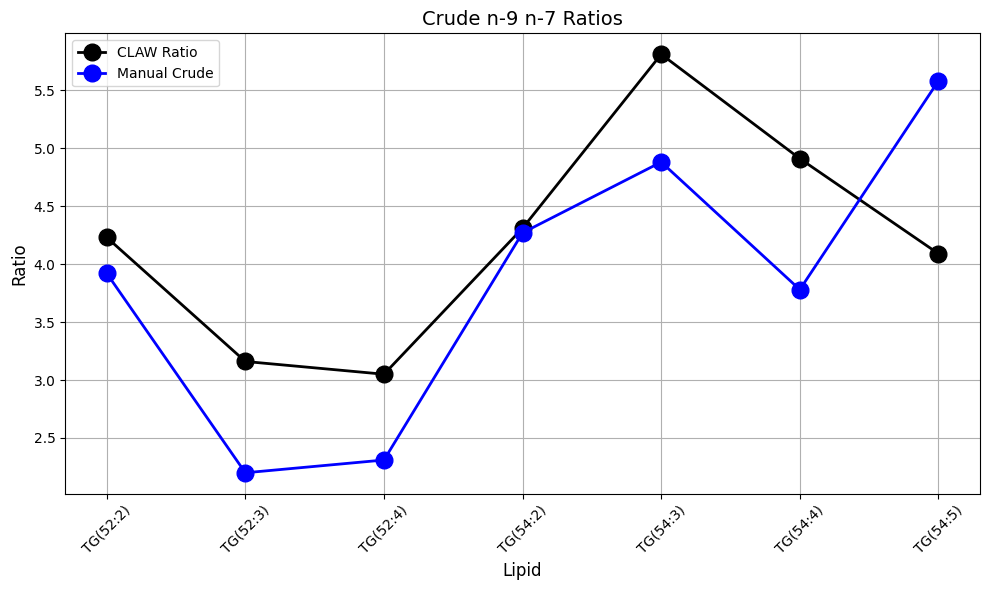

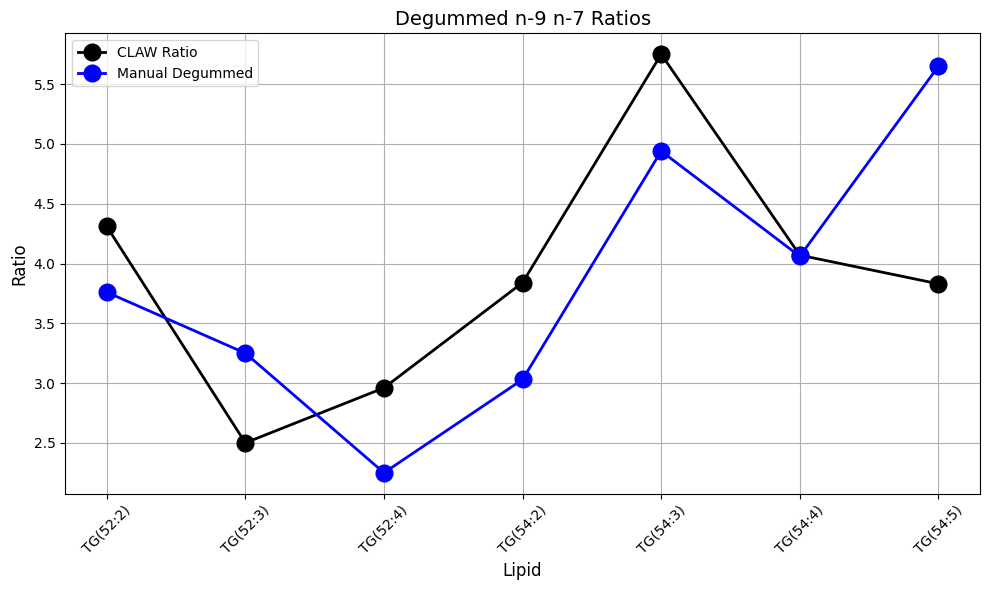

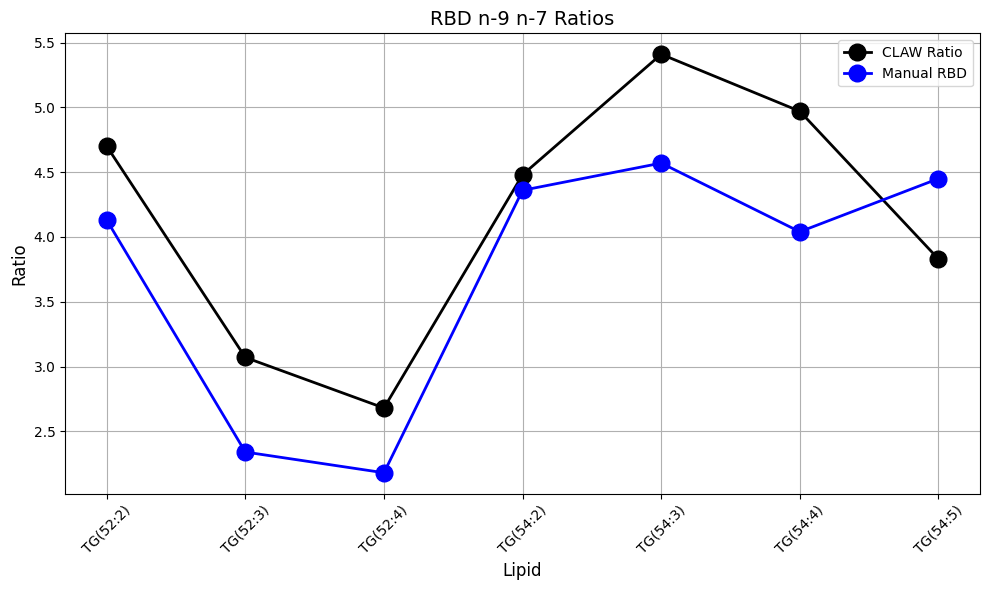

In [76]:
# Import the function from your Python file
from plot import plot_ratio_comparison

# Assuming df_sample1_ratio, df_sample2_ratio, and df_sample3_ratio are already loaded

# Plotting Crude comparison
plot_ratio_comparison(df_sample1_ratio, 'Crude', 'Crude')

# Plotting Degummed comparison
plot_ratio_comparison(df_sample2_ratio, 'Degummed', 'Degummed')

# Plotting RBD comparison
plot_ratio_comparison(df_sample3_ratio, 'RBD', 'RBD')


# Area Compare

In [30]:
# Manual Canola data for comparison
manual_canola = {
    'TG': ['TG(52:2)', 'TG(52:3)', 'TG(52:4)', 'TG(54:2)', 'TG(54:3)', 'TG(54:4)', 'TG(54:5)'],
    'Crude': [3.92, 2.2, 2.31, 4.27, 4.88, 3.78, 5.58],
    'Degummed': [3.76, 3.25, 2.25, 3.03, 4.94, 4.06, 5.65],
    'RBD': [4.13, 2.34, 2.18, 4.36, 4.57, 4.04, 4.45]
}

# Creating DataFrame for Manual Canola data
manual_df = pd.DataFrame(manual_canola)

In [78]:
def plot_ratio_comparison(df_sample_ratio, plot_title):
    plt.figure(figsize=(10, 6))
    
    # Plotting Height Ratio data (Black line, circle markers)
    plt.plot(df_sample_ratio['Lipid'], df_sample_ratio['Ratio'], 
             label='Height Ratio', color='black', marker='o', 
             markersize=12, linewidth=2)
    
    # Plotting Area Ratio data (Blue line, circle markers)
    plt.plot(df_sample_ratio['Lipid'], df_sample_ratio['Ratio_Area'], 
             label='Area Ratio', color='blue', marker='o', 
             markersize=12, linewidth=2)
    
    # Adding Title, Labels, and Legend
    plt.title(f'{plot_title} Height vs Area Ratios', fontsize=14)
    plt.xlabel('Lipid', fontsize=12)
    plt.ylabel('Ratio', fontsize=12)
    plt.legend()
    
    # Adding grid, rotating x-axis labels, and showing the plot
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    # # Saving the plot to a file
    # plt.savefig(f'Projects/canola/plots/{plot_title} Height vs Area Ratios.png', 
    #             dpi=300)
    
    # Show the plot
    plt.show()

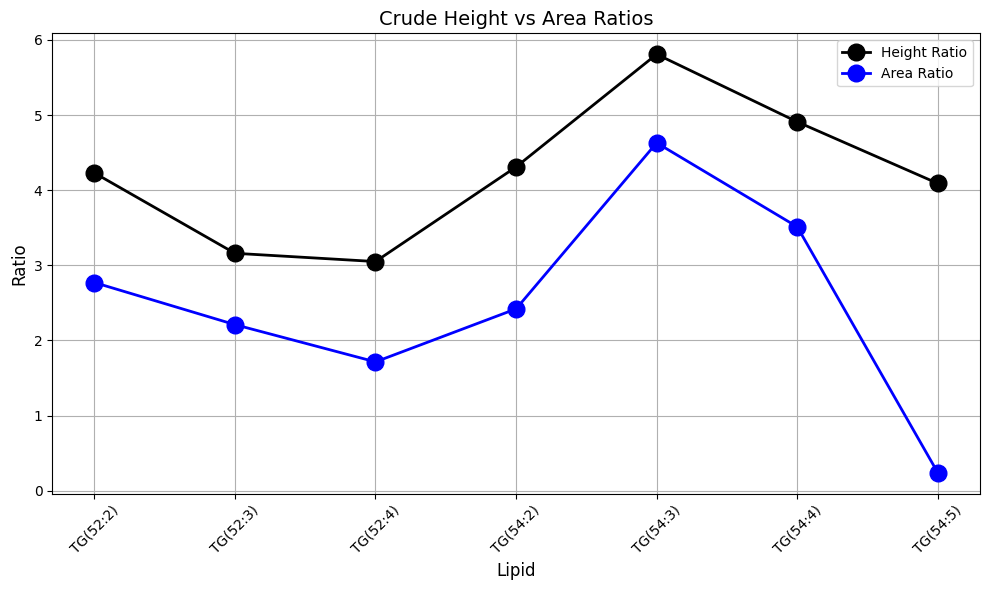

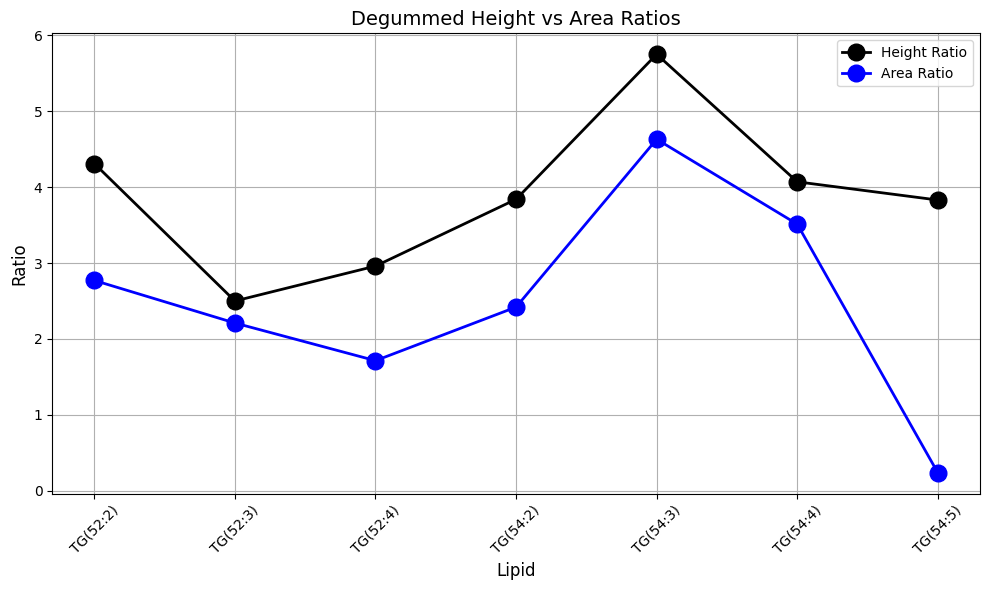

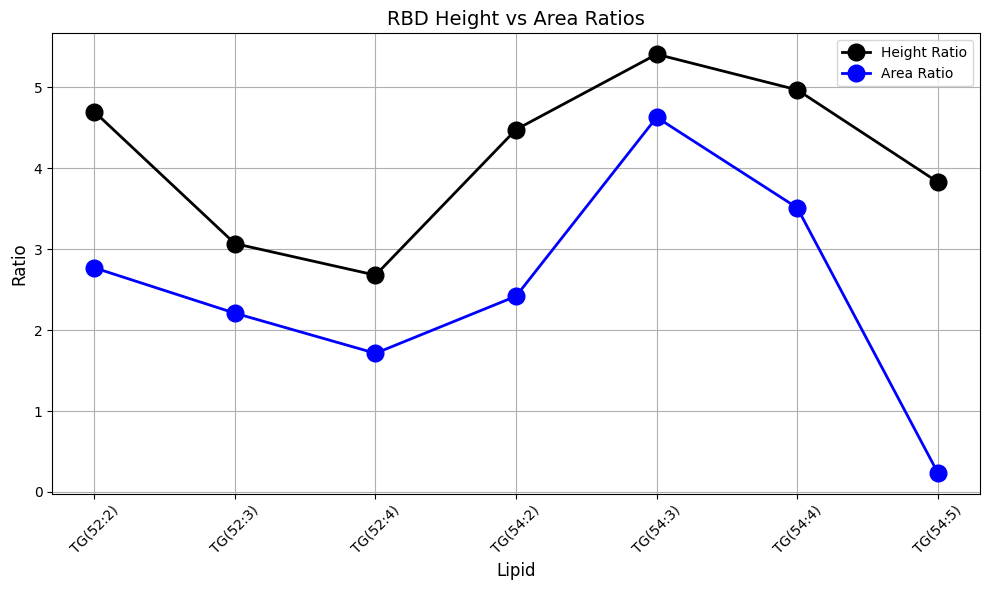

In [79]:
# Plotting Crude comparison
plot_ratio_comparison(df_sample1_ratio, 'Crude')

# Plotting Degummed comparison
plot_ratio_comparison(df_sample2_ratio, 'Degummed')

# Plotting RBD comparison
plot_ratio_comparison(df_sample3_ratio, 'RBD')

# Manual Area vs Area vs Max Intensity

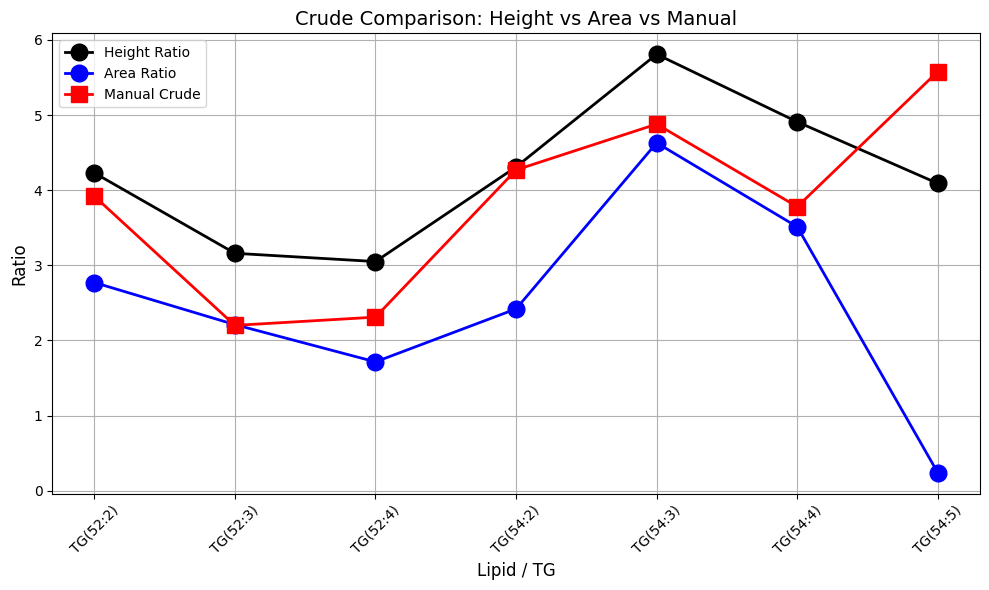

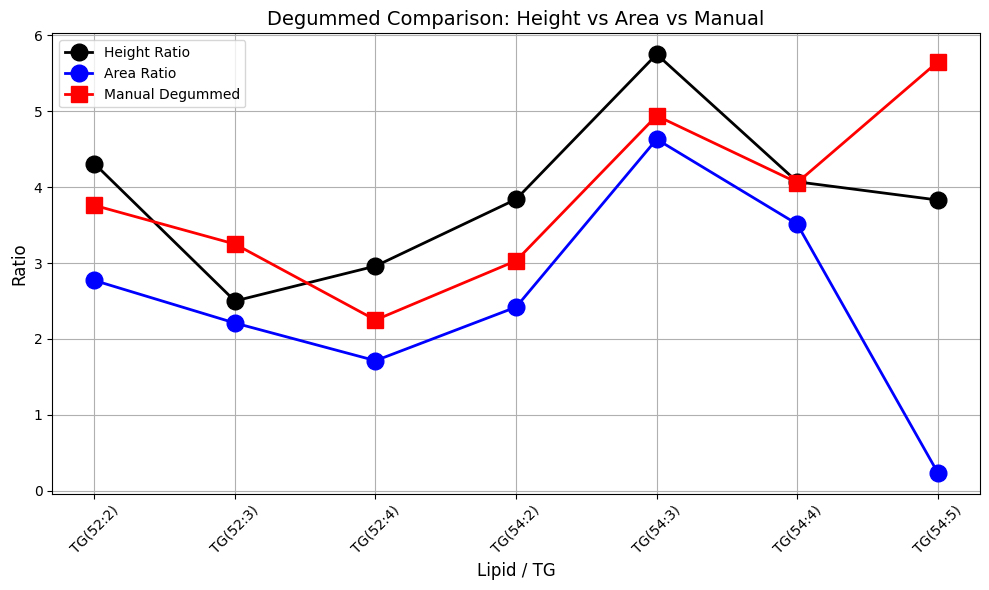

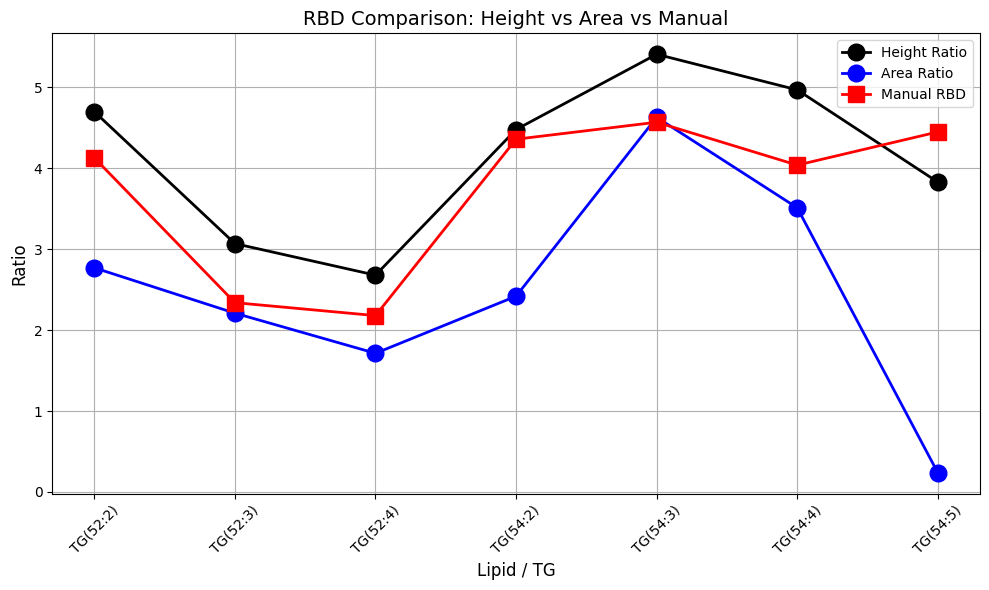

In [80]:
def plot_ratio_comparison(df_sample_ratio, manual_df, plot_title):
    plt.figure(figsize=(10, 6))
    
    # Plotting Height Ratio data (Black line, circle markers)
    plt.plot(df_sample_ratio['Lipid'], df_sample_ratio['Ratio'], 
             label='Height Ratio', color='black', marker='o', 
             markersize=12, linewidth=2)
    
    # Plotting Area Ratio data (Blue line, circle markers)
    plt.plot(df_sample_ratio['Lipid'], df_sample_ratio['Ratio_Area'], 
             label='Area Ratio', color='blue', marker='o', 
             markersize=12, linewidth=2)
    
    # Plotting Manual data (Red line, square markers)
    # The x-axis is taken from manual_df['TG'] and the y-axis from the column matching plot_title
    plt.plot(manual_df['TG'], manual_df[plot_title], 
             label=f'Manual {plot_title}', color='red', marker='s', 
             markersize=12, linewidth=2)
    
    # Adding Title, Labels, and Legend
    plt.title(f'{plot_title} Comparison: Height vs Area vs Manual', fontsize=14)
    plt.xlabel('Lipid / TG', fontsize=12)
    plt.ylabel('Ratio', fontsize=12)
    plt.legend()
    
    # Adding grid, rotating x-axis labels, and showing the plot
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    # Show the plot
    plt.show()

# Example manual data for comparison
manual_canola = {
    'TG': ['TG(52:2)', 'TG(52:3)', 'TG(52:4)', 'TG(54:2)', 'TG(54:3)', 'TG(54:4)', 'TG(54:5)'],
    'Crude': [3.92, 2.2, 2.31, 4.27, 4.88, 3.78, 5.58],
    'Degummed': [3.76, 3.25, 2.25, 3.03, 4.94, 4.06, 5.65],
    'RBD': [4.13, 2.34, 2.18, 4.36, 4.57, 4.04, 4.45]
}
manual_df = pd.DataFrame(manual_canola)

# Calling the function for each comparison
# Plotting Crude comparison
plot_ratio_comparison(df_sample1_ratio, manual_df, 'Crude')

# Plotting Degummed comparison
plot_ratio_comparison(df_sample2_ratio, manual_df, 'Degummed')

# Plotting RBD comparison
plot_ratio_comparison(df_sample3_ratio, manual_df, 'RBD')


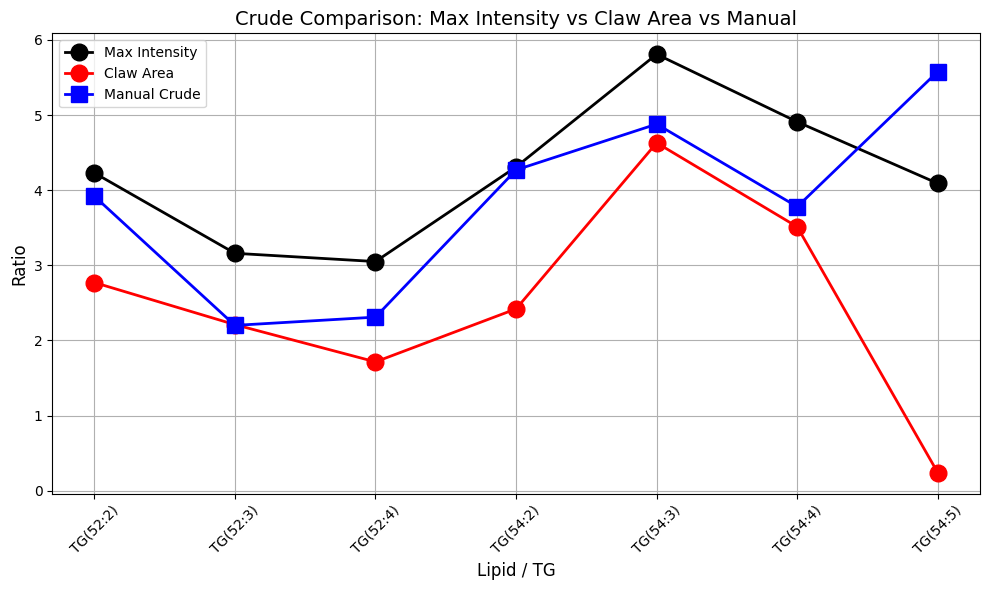

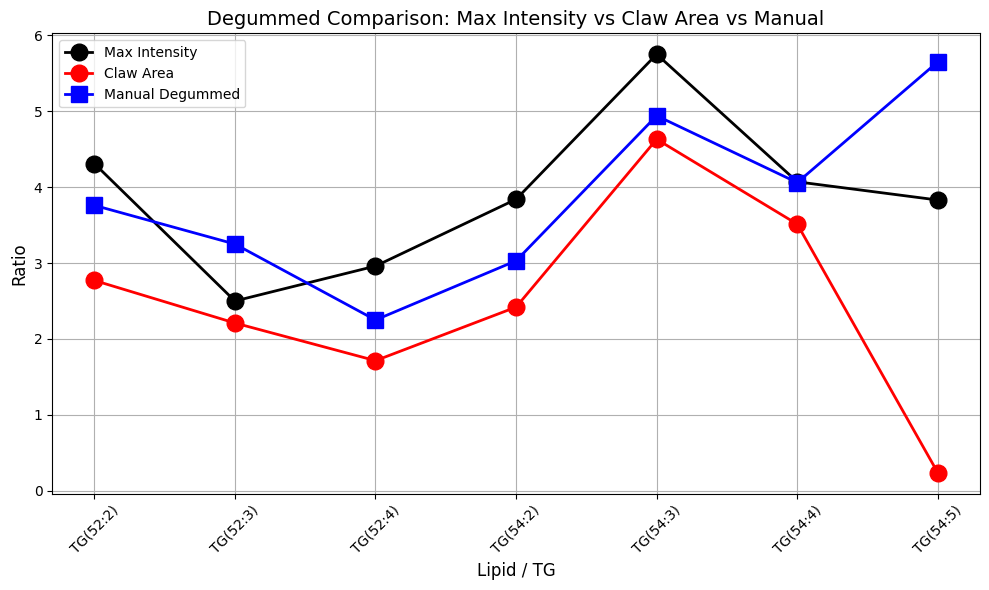

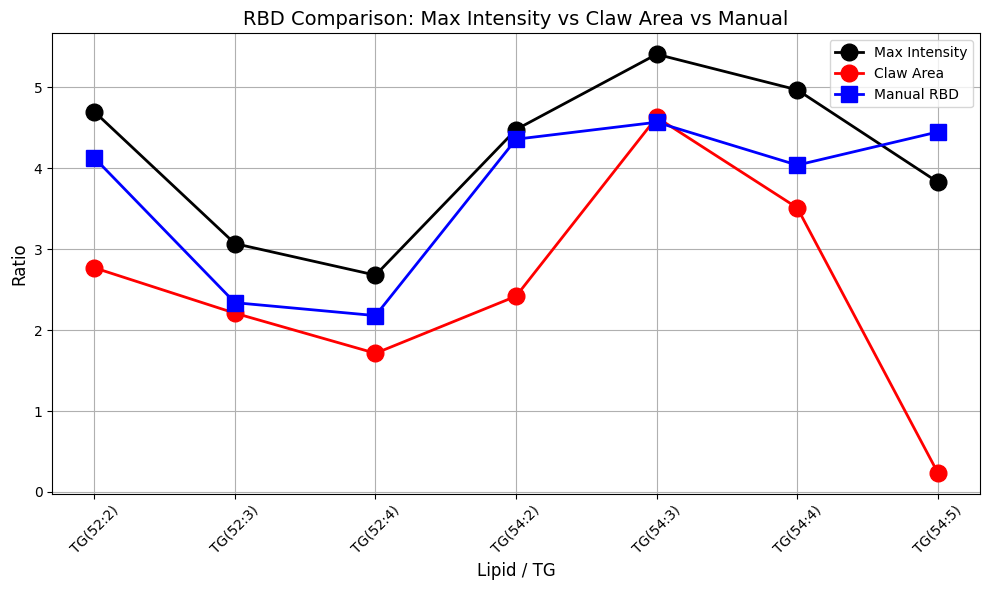

In [34]:
def plot_ratio_comparison(df_sample_ratio, manual_df, plot_title):
    plt.figure(figsize=(10, 6))
    
    # Plotting Max Intensity data (Black line, circle markers)
    plt.plot(df_sample_ratio['Lipid'], df_sample_ratio['Ratio'], 
             label='Max Intensity', color='black', marker='o', 
             markersize=12, linewidth=2)
    
    # Plotting Claw Area data (Red line, circle markers)
    plt.plot(df_sample_ratio['Lipid'], df_sample_ratio['Ratio_Area'], 
             label='Claw Area', color='red', marker='o', 
             markersize=12, linewidth=2)
    
    # Plotting Manual data (Blue line, square markers)
    plt.plot(manual_df['TG'], manual_df[plot_title], 
             label=f'Manual {plot_title}', color='blue', marker='s', 
             markersize=12, linewidth=2)
    
    # Adding Title, Labels, and Legend
    plt.title(f'{plot_title} Comparison: Max Intensity vs Claw Area vs Manual', fontsize=14)
    plt.xlabel('Lipid / TG', fontsize=12)
    plt.ylabel('Ratio', fontsize=12)
    plt.legend()
    
    # Adding grid, rotating x-axis labels, and showing the plot
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    # Show the plot
    plt.show()

# Example manual data for comparison
manual_canola = {
    'TG': ['TG(52:2)', 'TG(52:3)', 'TG(52:4)', 'TG(54:2)', 'TG(54:3)', 'TG(54:4)', 'TG(54:5)'],
    'Crude': [3.92, 2.2, 2.31, 4.27, 4.88, 3.78, 5.58],
    'Degummed': [3.76, 3.25, 2.25, 3.03, 4.94, 4.06, 5.65],
    'RBD': [4.13, 2.34, 2.18, 4.36, 4.57, 4.04, 4.45]
}
manual_df = pd.DataFrame(manual_canola)

# Plotting Crude comparison
plot_ratio_comparison(df_sample1_ratio, manual_df, 'Crude')

# Plotting Degummed comparison
plot_ratio_comparison(df_sample2_ratio, manual_df, 'Degummed')

# Plotting RBD comparison
plot_ratio_comparison(df_sample3_ratio, manual_df, 'RBD')


# Fixing TG(54:5) n-9 values

In [35]:
#                              Sample_ID    Peak_Area  Max_Intensity
# 0     CrudeCanola_O3on_150gN3_02082023  1340.531034    5259.140137
# 1  DegummedCanola_O3on_150gN3_02082023   974.122311    4061.100342
# 2       RBDCanola_O3on_150gN3_02082023   963.188023    3415.200195


# Update n-9 values
#                              Sample_ID   Peak_Area  Max_Intensity  \
# 0     CrudeCanola_O3on_150gN3_02082023  570.722155    5259.140137   
# 1  DegummedCanola_O3on_150gN3_02082023  281.616201    4061.100342   
# 2       RBDCanola_O3on_150gN3_02082023  310.892336    3415.200195   

# update n-7 values 
#                              Sample_ID   Peak_Area  Max_Intensity  \
# 0     CrudeCanola_O3on_150gN3_02082023  119.131259    1287.480103   
# 1  DegummedCanola_O3on_150gN3_02082023   82.849627    1060.780029   
# 2       RBDCanola_O3on_150gN3_02082023  136.591725     891.480042   
# 119


In [36]:
import pandas as pd

# Assuming df_sample1 is already defined
# For example, if you load it from a CSV:
# df_sample1 = pd.read_csv('your_file.csv')

# Define the new value for peak_area
new_peak_area_n9 = 570  # Replace this with your desired value

# Create a boolean mask to select the row where Lipid is "[TG(54:5)]_FA18:1" and db_pos is "n-9"
mask = (df_sample1['Lipid'] == '[TG(54:5)]_FA18:1') & (df_sample1['db_pos'] == 'n-9')

# Update the 'peak_area' column for the selected row(s)
df_sample1.loc[mask, 'peak_area'] = new_peak_area_n9

# (Optional) Print the updated rows to verify the change
print(df_sample1.loc[mask])

# Define the new value for peak_area
new_peak_area_n9 = 281  # Replace this with your desired value

# Create a boolean mask to select the row where Lipid is "[TG(54:5)]_FA18:1" and db_pos is "n-9"
mask = (df_sample2['Lipid'] == '[TG(54:5)]_FA18:1') & (df_sample2['db_pos'] == 'n-9')

# Update the 'peak_area' column for the selected row(s)
df_sample2.loc[mask, 'peak_area'] = new_peak_area_n9

# (Optional) Print the updated rows to verify the change
print(df_sample2.loc[mask])

# Define the new value for peak_area
new_peak_area_n9 = 310  # Replace this with your desired value

# Create a boolean mask to select the row where Lipid is "[TG(54:5)]_FA18:1" and db_pos is "n-9"
mask = (df_sample3['Lipid'] == '[TG(54:5)]_FA18:1') & (df_sample3['db_pos'] == 'n-9')

# Update the 'peak_area' column for the selected row(s)
df_sample3.loc[mask, 'peak_area'] = new_peak_area_n9

# (Optional) Print the updated rows to verify the change
print(df_sample3.loc[mask])


   Class              Lipid  OzESI_Intensity  Precursor_Ion  Product_Ion  \
26   NaN  [TG(54:5)]_FA18:1           5259.0          788.6      599.596   

    Retention_Time                         Sample_ID        Transition  \
26           14.31  CrudeCanola_O3on_150gN3_02082023  788.6 -> 599.596   

    peak_area  peak_start  peak_stop  peak_middle  is_special_case    n-7  \
26    1340.53   14.296509  14.330117    14.313817                0  706.6   

      n-9   n-12 db_pos  Ratio  Ratio_Area  
26  678.6  636.6    n-9   4.09    0.237686  
   Class              Lipid  OzESI_Intensity  Precursor_Ion  Product_Ion  \
26   NaN  [TG(54:5)]_FA18:1           4061.0          788.6      599.596   

    Retention_Time                            Sample_ID        Transition  \
26            14.2  DegummedCanola_O3on_150gN3_02082023  788.6 -> 599.596   

    peak_area  peak_start  peak_stop  peak_middle  is_special_case    n-7  \
26    947.512   14.134832  14.232197    14.199683                0  

In [91]:
import pandas as pd

# Assuming df_sample1, df_sample2, and df_sample3 are already defined
# For example:
# df_sample1 = pd.read_csv('sample1.csv')
# df_sample2 = pd.read_csv('sample2.csv')
# df_sample3 = pd.read_csv('sample3.csv')

# -------------------------------
# Update n-9 values for '[TG(54:5)]_FA18:1'
# -------------------------------

# For df_sample1: db_pos 'n-9'
new_peak_area_n9_sample1 = 570  # Replace with your desired value for df_sample1
mask_n9 = (df_sample1['Lipid'] == '[TG(54:5)]_FA18:1') & (df_sample1['db_pos'] == 'n-9')
df_sample1.loc[mask_n9, 'peak_area'] = new_peak_area_n9_sample1
print("df_sample1 - n-9 update:")
print(df_sample1.loc[mask_n9])

# For df_sample2: db_pos 'n-9'
new_peak_area_n9_sample2 = 281  # Replace with your desired value for df_sample2
mask_n9 = (df_sample2['Lipid'] == '[TG(54:5)]_FA18:1') & (df_sample2['db_pos'] == 'n-9')
df_sample2.loc[mask_n9, 'peak_area'] = new_peak_area_n9_sample2
print("df_sample2 - n-9 update:")
print(df_sample2.loc[mask_n9])

# For df_sample3: db_pos 'n-9'
new_peak_area_n9_sample3 = 310  # Replace with your desired value for df_sample3
mask_n9 = (df_sample3['Lipid'] == '[TG(54:5)]_FA18:1') & (df_sample3['db_pos'] == 'n-9')
df_sample3.loc[mask_n9, 'peak_area'] = new_peak_area_n9_sample3
print("df_sample3 - n-9 update:")
print(df_sample3.loc[mask_n9])


# -------------------------------
# Update n-7 values for '[TG(54:5)]_FA18:1'
# -------------------------------

# For df_sample1: db_pos 'n-7'
new_peak_area_n7_sample1 = 119  # Replace with your desired value for df_sample1 (n-7)
mask_n7 = (df_sample1['Lipid'] == '[TG(54:5)]_FA18:1') & (df_sample1['db_pos'] == 'n-7')
df_sample1.loc[mask_n7, 'peak_area'] = new_peak_area_n7_sample1
print("df_sample1 - n-7 update:")
print(df_sample1.loc[mask_n7])

# For df_sample2: db_pos 'n-7'
new_peak_area_n7_sample2 = 82  # Replace with your desired value for df_sample2 (n-7)
mask_n7 = (df_sample2['Lipid'] == '[TG(54:5)]_FA18:1') & (df_sample2['db_pos'] == 'n-7')
df_sample2.loc[mask_n7, 'peak_area'] = new_peak_area_n7_sample2
print("df_sample2 - n-7 update:")
print(df_sample2.loc[mask_n7])

# For df_sample3: db_pos 'n-7'
new_peak_area_n7_sample3 = 136  # Replace with your desired value for df_sample3 (n-7)
mask_n7 = (df_sample3['Lipid'] == '[TG(54:5)]_FA18:1') & (df_sample3['db_pos'] == 'n-7')
df_sample3.loc[mask_n7, 'peak_area'] = new_peak_area_n7_sample3
print("df_sample3 - n-7 update:")
print(df_sample3.loc[mask_n7])


df_sample1 - n-9 update:
   Class              Lipid  OzESI_Intensity  Precursor_Ion  Product_Ion  \
26   NaN  [TG(54:5)]_FA18:1           5259.0          788.6      599.596   

    Retention_Time                         Sample_ID        Transition  \
26           14.31  CrudeCanola_O3on_150gN3_02082023  788.6 -> 599.596   

    peak_area  peak_start  peak_stop  peak_middle  is_special_case    n-7  \
26      570.0   14.296509  14.330117    14.313817                0  706.6   

      n-9   n-12 db_pos  Ratio  Ratio_Area  
26  678.6  636.6    n-9   4.09    4.789916  
df_sample2 - n-9 update:
   Class              Lipid  OzESI_Intensity  Precursor_Ion  Product_Ion  \
26   NaN  [TG(54:5)]_FA18:1           4061.0          788.6      599.596   

    Retention_Time                            Sample_ID        Transition  \
26            14.2  DegummedCanola_O3on_150gN3_02082023  788.6 -> 599.596   

    peak_area  peak_start  peak_stop  peak_middle  is_special_case    n-7  \
26      281.0   14

# update ratio

In [92]:
import pandas as pd

def update_ratio_area_for_sample(df, sample_name="Sample"):
    print(f"\nProcessing {sample_name}:")
    
    # Create masks for TG(54:5) with db_pos 'n-9' and 'n-7'
    mask_n9 = (df['Lipid'] == '[TG(54:5)]_FA18:1') & (df['db_pos'] == 'n-9')
    mask_n7 = (df['Lipid'] == '[TG(54:5)]_FA18:1') & (df['db_pos'] == 'n-7')
    
    # Check if the required rows exist
    if df.loc[mask_n9].empty:
        print("No row found for [TG(54:5)]_FA18:1 with db_pos n-9")
        return
    if df.loc[mask_n7].empty:
        print("No row found for [TG(54:5)]_FA18:1 with db_pos n-7")
        return
    
    # Print values before update
    print("Before update:")
    print("n-9 row:")
    print(df.loc[mask_n9, ['peak_area', 'Ratio_Area']])
    print("n-7 row (for reference, peak_area):")
    print(df.loc[mask_n7, ['peak_area']])
    
    # Retrieve the peak_area values
    peak_area_n9 = df.loc[mask_n9, 'peak_area'].values[0]
    peak_area_n7 = df.loc[mask_n7, 'peak_area'].values[0]
    
    # Calculate the new ratio_area as peak_area(n-9) / peak_area(n-7)
    new_ratio_area = peak_area_n9 / peak_area_n7
    
    # Update the Ratio_Area column for the n-9 row
    df.loc[mask_n9, 'Ratio_Area'] = new_ratio_area
    
    # Print values after update
    print("After update:")
    print("n-9 row:")
    print(df.loc[mask_n9, ['peak_area', 'Ratio_Area']])
    
# Example usage for three DataFrames:
# Assuming df_sample1, df_sample2, and df_sample3 are already defined

update_ratio_area_for_sample(df_sample1, "df_sample1")
update_ratio_area_for_sample(df_sample2, "df_sample2")
update_ratio_area_for_sample(df_sample3, "df_sample3")



Processing df_sample1:
Before update:
n-9 row:
    peak_area  Ratio_Area
26      570.0    4.789916
n-7 row (for reference, peak_area):
    peak_area
28      119.0
After update:
n-9 row:
    peak_area  Ratio_Area
26      570.0    4.789916

Processing df_sample2:
Before update:
n-9 row:
    peak_area  Ratio_Area
26      281.0    0.237686
n-7 row (for reference, peak_area):
    peak_area
28       82.0
After update:
n-9 row:
    peak_area  Ratio_Area
26      281.0    3.426829

Processing df_sample3:
Before update:
n-9 row:
    peak_area  Ratio_Area
26      310.0    0.237686
n-7 row (for reference, peak_area):
    peak_area
28      136.0
After update:
n-9 row:
    peak_area  Ratio_Area
26      310.0    2.279412


In [93]:
import pandas as pd

# Assuming df_sample1 is already defined. For example, you might load it like:
# df_sample1 = pd.read_csv('your_file.csv')

# Create masks to select the rows for TG(54:5) with db_pos n-9 and n-7 respectively
mask_n9 = (df_sample1['Lipid'] == '[TG(54:5)]_FA18:1') & (df_sample1['db_pos'] == 'n-9')
mask_n7 = (df_sample1['Lipid'] == '[TG(54:5)]_FA18:1') & (df_sample1['db_pos'] == 'n-7')

# Print before update values
print("Before update:")
print("n-9 row:")
print(df_sample1.loc[mask_n9, ['peak_area', 'Ratio_Area']])
print("\nn-7 row (for reference, peak_area):")
print(df_sample1.loc[mask_n7, ['peak_area']])

# Retrieve the peak_area values for both rows
peak_area_n9 = df_sample1.loc[mask_n9, 'peak_area'].values[0]
peak_area_n7 = df_sample1.loc[mask_n7, 'peak_area'].values[0]

# Calculate the new ratio_area (n-9 divided by n-7)
new_ratio_area = peak_area_n9 / peak_area_n7

# Update the Ratio_Area column in the n-9 row with the new value
df_sample1.loc[mask_n9, 'Ratio_Area'] = new_ratio_area

# Print after update values
print("\nAfter update:")
print("n-9 row:")
print(df_sample1.loc[mask_n9, ['peak_area', 'Ratio_Area']])


Before update:
n-9 row:
    peak_area  Ratio_Area
26      570.0    4.789916

n-7 row (for reference, peak_area):
    peak_area
28      119.0

After update:
n-9 row:
    peak_area  Ratio_Area
26      570.0    4.789916


In [94]:
# Filter rows where 'Ratio' is not NaN
df_sample1_ratio = df_sample1[df_sample1['Ratio'].notna()].reset_index(drop=True)
df_sample2_ratio = df_sample2[df_sample2['Ratio'].notna()].reset_index(drop=True)
df_sample3_ratio = df_sample3[df_sample3['Ratio'].notna()].reset_index(drop=True)

# Process df_sample1_ratio
df_sample1_ratio = process_dataframe(df_sample1_ratio, lipids_to_drop)

# Process df_sample2_ratio
df_sample2_ratio = process_dataframe(df_sample2_ratio, lipids_to_drop)

# Process df_sample3_ratio
df_sample3_ratio = process_dataframe(df_sample3_ratio, lipids_to_drop)


# plots again after update

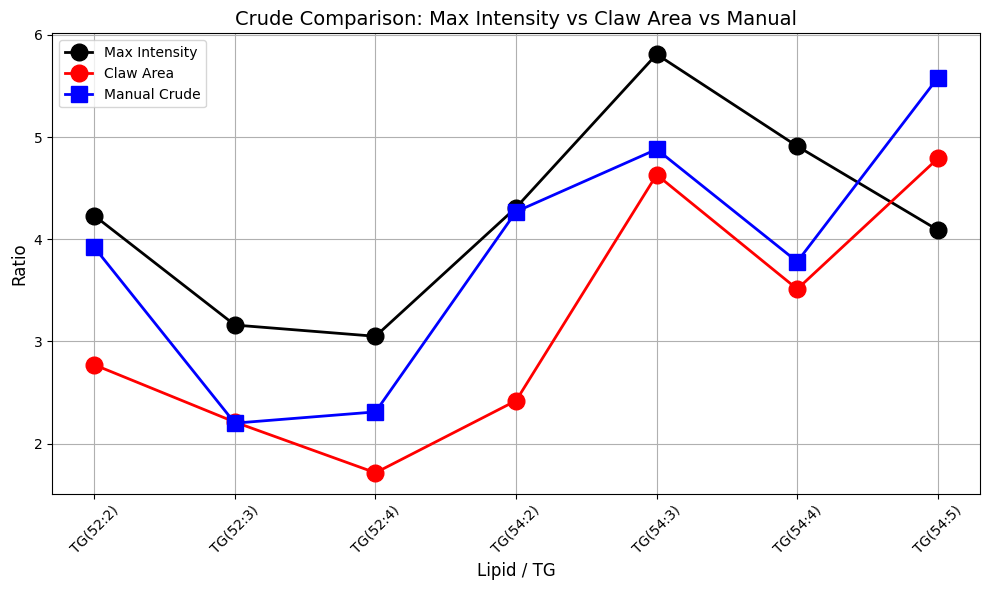

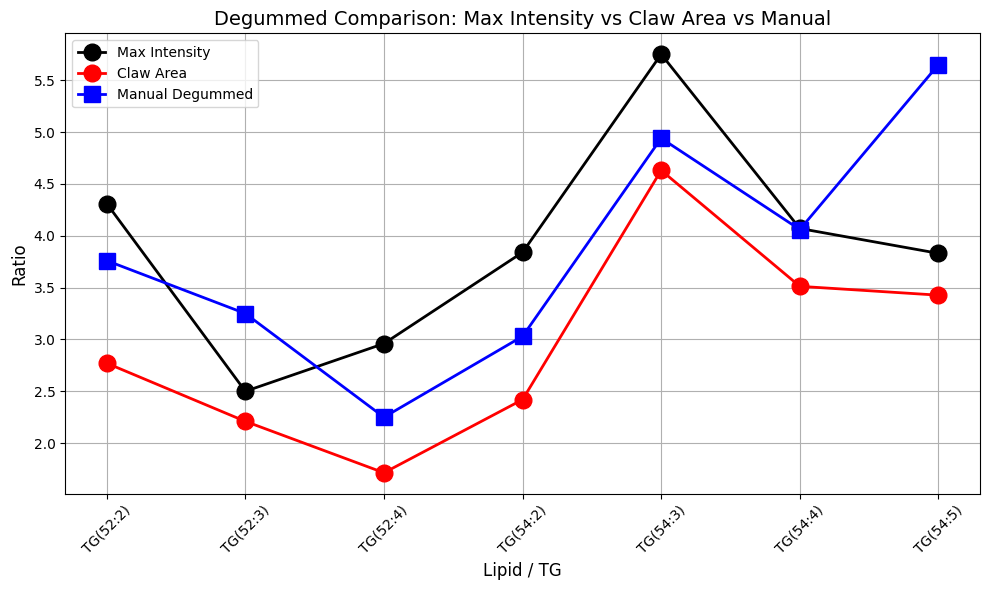

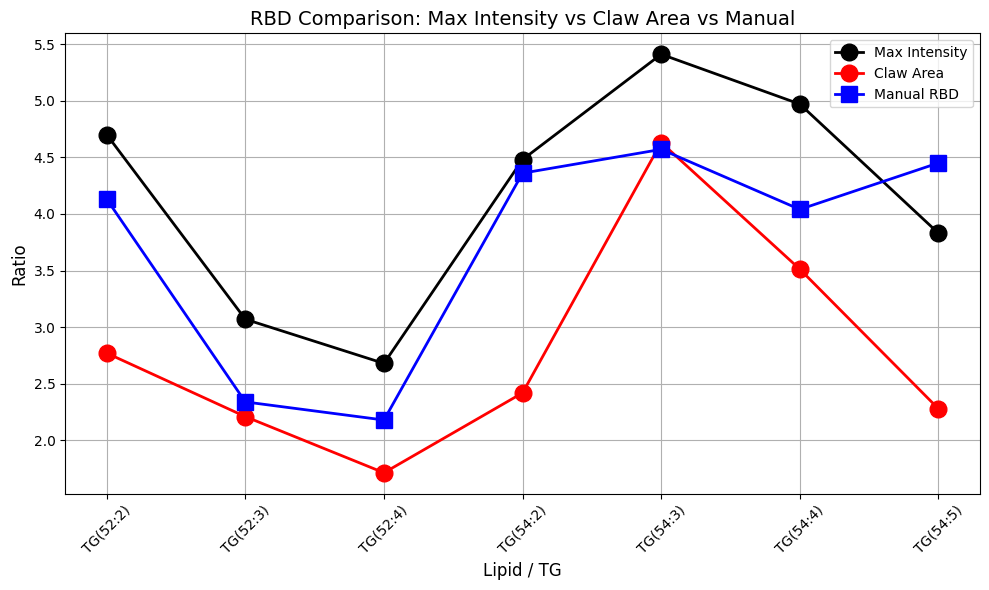

In [95]:
def plot_ratio_comparison(df_sample_ratio, manual_df, plot_title):
    plt.figure(figsize=(10, 6))
    
    # Plotting Max Intensity data (Black line, circle markers)
    plt.plot(df_sample_ratio['Lipid'], df_sample_ratio['Ratio'], 
             label='Max Intensity', color='black', marker='o', 
             markersize=12, linewidth=2)
    
    # Plotting Claw Area data (Red line, circle markers)
    plt.plot(df_sample_ratio['Lipid'], df_sample_ratio['Ratio_Area'], 
             label='Claw Area', color='red', marker='o', 
             markersize=12, linewidth=2)
    
    # Plotting Manual data (Blue line, square markers)
    plt.plot(manual_df['TG'], manual_df[plot_title], 
             label=f'Manual {plot_title}', color='blue', marker='s', 
             markersize=12, linewidth=2)
    
    # Adding Title, Labels, and Legend
    plt.title(f'{plot_title} Comparison: Max Intensity vs Claw Area vs Manual', fontsize=14)
    plt.xlabel('Lipid / TG', fontsize=12)
    plt.ylabel('Ratio', fontsize=12)
    plt.legend()
    
    # Adding grid, rotating x-axis labels, and showing the plot
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    # Show the plot
    plt.show()

# Example manual data for comparison
manual_canola = {
    'TG': ['TG(52:2)', 'TG(52:3)', 'TG(52:4)', 'TG(54:2)', 'TG(54:3)', 'TG(54:4)', 'TG(54:5)'],
    'Crude': [3.92, 2.2, 2.31, 4.27, 4.88, 3.78, 5.58],
    'Degummed': [3.76, 3.25, 2.25, 3.03, 4.94, 4.06, 5.65],
    'RBD': [4.13, 2.34, 2.18, 4.36, 4.57, 4.04, 4.45]
}
manual_df = pd.DataFrame(manual_canola)

# Plotting Crude comparison
plot_ratio_comparison(df_sample1_ratio, manual_df, 'Crude')

# Plotting Degummed comparison
plot_ratio_comparison(df_sample2_ratio, manual_df, 'Degummed')

# Plotting RBD comparison
plot_ratio_comparison(df_sample3_ratio, manual_df, 'RBD')


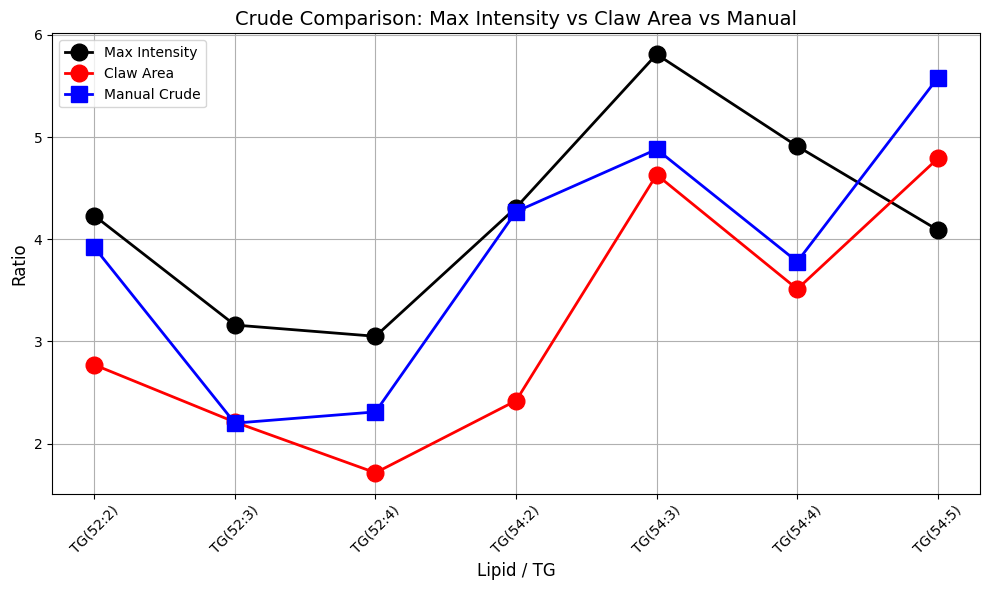

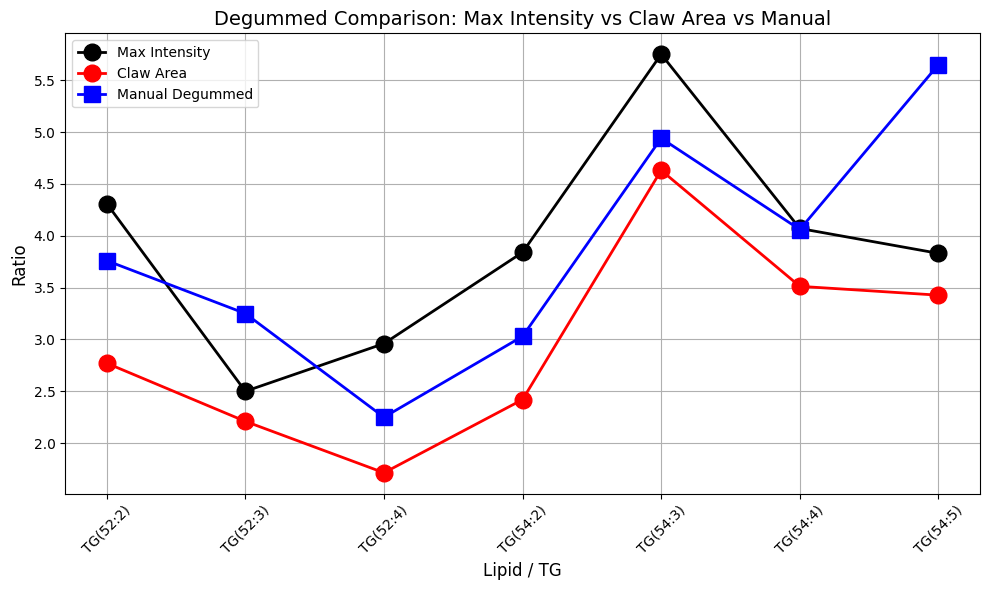

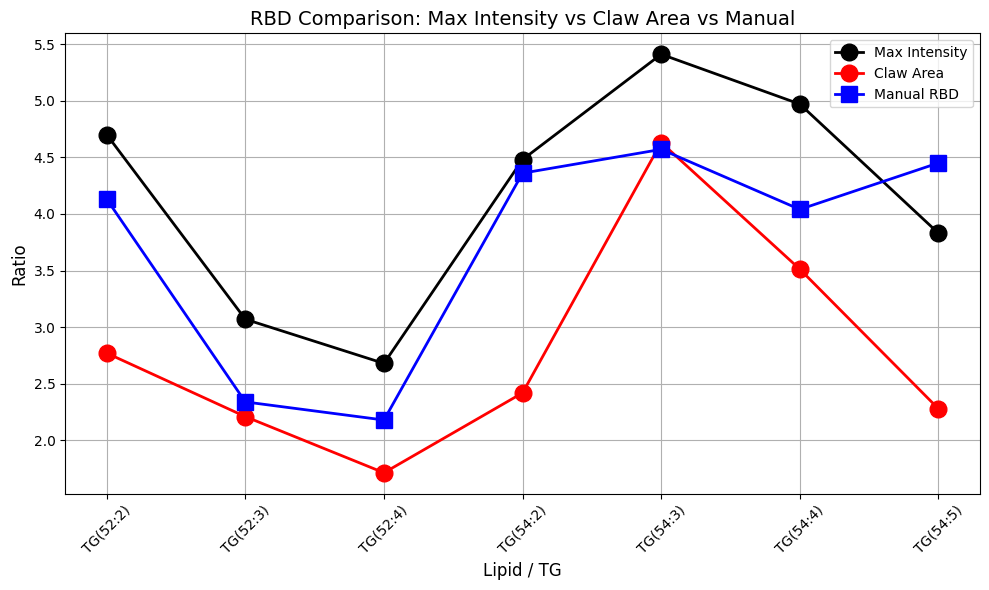

In [ ]:
def plot_ratio_comparison(df_sample_ratio, manual_df, plot_title):
    plt.figure(figsize=(10, 6))
    
    # Plotting Max Intensity data (Black line, circle markers)
    plt.plot(df_sample_ratio['Lipid'], df_sample_ratio['Ratio'], 
             label='Max Intensity', color='black', marker='o', 
             markersize=12, linewidth=2)
    
    # Plotting Claw Area data (Red line, circle markers)
    plt.plot(df_sample_ratio['Lipid'], df_sample_ratio['Ratio_Area'], 
             label='Claw Area', color='red', marker='o', 
             markersize=12, linewidth=2)
    
    # Plotting Manual data (Blue line, square markers)
    plt.plot(manual_df['TG'], manual_df[plot_title], 
             label=f'Manual {plot_title}', color='blue', marker='s', 
             markersize=12, linewidth=2)
    
    # Adding Title, Labels, and Legend
    plt.title(f'{plot_title} Comparison: Max Intensity vs Claw Area vs Manual', fontsize=14)
    plt.xlabel('Lipid / TG', fontsize=12)
    plt.ylabel('Ratio', fontsize=12)
    plt.legend()
    
    # Adding grid, rotating x-axis labels, and showing the plot
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    # Show the plot
    plt.show()

# Example manual data for comparison
manual_canola = {
    'TG': ['TG(52:2)', 'TG(52:3)', 'TG(52:4)', 'TG(54:2)', 'TG(54:3)', 'TG(54:4)', 'TG(54:5)'],
    'Crude': [3.92, 2.2, 2.31, 4.27, 4.88, 3.78, 5.58],
    'Degummed': [3.76, 3.25, 2.25, 3.03, 4.94, 4.06, 5.65],
    'RBD': [4.13, 2.34, 2.18, 4.36, 4.57, 4.04, 4.45]
}
manual_df = pd.DataFrame(manual_canola)

# Plotting Crude comparison
plot_ratio_comparison(df_sample1_ratio, manual_df, 'Crude')

# Plotting Degummed comparison
plot_ratio_comparison(df_sample2_ratio, manual_df, 'Degummed')

# Plotting RBD comparison
plot_ratio_comparison(df_sample3_ratio, manual_df, 'RBD')


In [39]:
# 103.785343 
# 66.122035 
# 36.53388

### Lipidomic OzESI Data Visualization

This section presents the visual representation of the lipidomic OzESI data, focusing on the ratio analysis of isomeric lipids based on their double bond location. By default, the visualization emphasizes the n-9/n-7 ratios, but the configuration can be tailored to accommodate any specific double bond location on a lipid. Select the directory where the plots will be saved.

In [40]:
# from plot import process_and_plot

# # Define output directories for each sample
# project = 'Projects/canola/'
# plot_folder = 'plots/'

# output_directory_crude = os.path.join(project, plot_folder, 'crude')
# output_directory_degummed = os.path.join(project, plot_folder, 'degummed')
# output_directory_rbd = os.path.join(project, plot_folder, 'rbd')

# # Assuming df_sample1_ratio, df_sample2_ratio, and df_sample3_ratio are already loaded

# # Process and plot for each sample
# process_and_plot(df_sample1_ratio, 'Crude', output_directory_crude)
# process_and_plot(df_sample2_ratio, 'Degummed', output_directory_degummed)
# process_and_plot(df_sample3_ratio, 'RBD', output_directory_rbd)


# Ratio Plot for Paper

In [41]:
from plot import plot_canola_comparison

# Assuming df_sample1_ratio, df_sample2_ratio, and df_sample3_ratio are already loaded

# Plot and display the comparison
plot_canola_comparison(df_sample1_ratio, df_sample2_ratio, df_sample3_ratio)

# Alternatively, save the plot to a file
# plot_canola_comparison(df_sample1_ratio, df_sample2_ratio, df_sample3_ratio, output_file="canola_comparison.png")
